In [1]:
import config
from config import *
%matplotlib inline



2022-01-16 11:10:56.095878: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
#load the two class dataset
a = two_class_xrf_data()
accepts, not_cells = a.load_data()

accept_Cu = accepts[0]
accept_Zn = accepts[1]
accept_Ca = accepts[2]
accept_K = accepts[3]
accept_P = accepts[4]
accept_S = accepts[5]
accept_Fe = accepts[6]
accept_Ni = accepts[7]
accept_TFY = accepts[8]

not_cell_Cu = not_cells[0]
not_cell_Zn = not_cells[1]
not_cell_Ca = not_cells[2]
not_cell_K = not_cells[3]
not_cell_P = not_cells[4]
not_cell_S = not_cells[5]
not_cell_Fe = not_cells[6]
not_cell_Ni = not_cells[7]
not_cell_TFY = not_cells[8]

In [3]:
print('accept_Cu.shape :', accept_Cu.shape)
print('accept_Ca.shape :', accept_Ca.shape)
print('accept_K.shape :', accept_K.shape)

accept_Cu.shape : (429, 28, 28)
accept_Ca.shape : (429, 28, 28)
accept_K.shape : (429, 28, 28)


In [4]:
print('not_cell_Cu.shape :', not_cell_Cu.shape)
print('not_cell_Ca.shape :', not_cell_Ca.shape)
print('not_cell_K.shape :', not_cell_K.shape)

not_cell_Cu.shape : (257, 28, 28)
not_cell_Ca.shape : (257, 28, 28)
not_cell_K.shape : (257, 28, 28)


In [5]:
#Only used Cu channel a see a VAE before moving on to multichannel images


In [6]:
y_accept=np.empty(accept_Cu.shape[0])
y_not_cell=np.empty(not_cell_Cu.shape[0])

for i in range(y_accept.shape[0]):
        y_accept[i]=1
        
        
for i in range(y_not_cell.shape[0]):
        y_not_cell[i]=0

        
x_train = np.concatenate((accept_Cu,not_cell_Cu) , axis = 0)
y_train = np.concatenate((y_accept,y_not_cell) , axis = 0).astype(int)

In [7]:
#Normalize data to grayscale

def normalize8(I):
    
    mn = I.min()
      
    mx = I.max()

    mx -= mn

    I = ((I - mn)/mx) * 255
  
    return I.astype(np.uint8)
#     return I.astype(int)


In [8]:
norm_x_train=x_train
for idx, value in enumerate(x_train):
    norm_x_train[idx]=normalize8(x_train[idx])
    
norm_x_train=norm_x_train.astype(int)    

In [9]:
print('x_train.shape :', x_train.shape)
print('x_train.dtype :', x_train.dtype)
print('y_train.shape :', y_train.shape)
print('y_train.dtype :', y_train.dtype)

x_train.shape : (686, 28, 28)
x_train.dtype : float32
y_train.shape : (686,)
y_train.dtype : int64


In [10]:
print('norm_x_train.shape :', norm_x_train.shape)
print('norm_x_train.dtype :', norm_x_train.dtype)
print('y_train.shape :', y_train.shape)
print('y_train.dtype :', y_train.dtype)

norm_x_train.shape : (686, 28, 28)
norm_x_train.dtype : int64
y_train.shape : (686,)
y_train.dtype : int64


In [11]:
#expand dimension


# mod_x_train = np.expand_dims(binarized_x_train, -1).astype("float32") / 255
# mod_x_train = np.expand_dims(binarized_x_train, -1)
mod_x_train = np.expand_dims(norm_x_train, -1).astype("float32") / 255

#expand dimension



In [12]:
print('mod_x_train.shape :', mod_x_train.shape)
print('mod_x_train.dtype :', mod_x_train.dtype)
print('y_train.shape :', y_train.shape)
print('y_train.dtype :', y_train.dtype)

mod_x_train.shape : (686, 28, 28, 1)
mod_x_train.dtype : float32
y_train.shape : (686,)
y_train.dtype : int64


In [13]:
#Allocate memory First
import tensorflow as tf
GPU_mem_limit=4.0
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=GPU_mem_limit*1000.0)])

    except RuntimeError as e:
        print(e)        
        

2022-01-16 11:11:32.783838: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-01-16 11:11:32.819011: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 8000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 47.45GiB deviceMemoryBandwidth: 625.94GiB/s
2022-01-16 11:11:32.819093: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-01-16 11:11:32.819167: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-01-16 11:11:32.819205: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11
2022-01-16 11:11:32.819247: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcufft.so.10

In [14]:
#Adding VAE

# INITIALIZERS

BASE_PATCH_WIDTH=28  #Width of the cell (pixels)

latent_dim=16

num_channels = 1

cell_types=2
noise_amplitude=0.000
        
encoder,decoder=autoencoder(latent_dim,num_channels,BASE_PATCH_WIDTH,summary='yes')



Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 14, 14, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 7, 7, 64)     18496       conv2d[0][0]                     
__________________________________________________________________________________________________
flatten (Flatten)               (None, 3136)         0           conv2d_1[0][0]                   
____________________________________________________________________________________________

2022-01-16 11:11:34.437238: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-01-16 11:11:34.443263: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 8000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 47.45GiB deviceMemoryBandwidth: 625.94GiB/s
2022-01-16 11:11:34.448828: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1871] Adding visible gpu devices: 0
2022-01-16 11:11:34.449020: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-01-16 11:11:34.903059: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1258] Device interconnect Str

In [15]:
# x_train_noisy = single_noise_addition('grayscale',noise_amplitude,x_train)

In [16]:
# x_train_clipped = np.clip(x_train_noisy*255, 0,255)

In [17]:
from ipywidgets import interactive
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def viewer(index):
    plt.figure(figsize=(5,5))
    plt.imshow(mod_x_train[index], interpolation = 'spline16' )
    plt.colorbar(orientation='horizontal',shrink=0.8, location='top')
    plt.show()


interactive_image = interactive(viewer, index = (0,x_train.shape[0]-1))
output = interactive_image.children[-1]
# output.layout.height = '300px'
interactive_image

interactive(children=(IntSlider(value=342, description='index', max=685), Output()), _dom_classes=('widget-int…

In [18]:
# threshold = threshold_otsu(x_train)
# # binarized_x_train = x_train > threshold
# binarized_x_train = x_train > 61
# binarized_x_train=np.multiply(binarized_x_train, 1)

# binarized_x_train.shape

In [19]:
# threshold

In [20]:
# from ipywidgets import interactive
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1 import make_axes_locatable

# def viewer(index):
#     plt.figure(figsize=(5,5))
#     plt.imshow(binarized_x_train[index])
#     plt.colorbar(orientation='horizontal', shrink=0.8, location='top')
#     plt.show()


# interactive_image = interactive(viewer, index = (0,x_train.shape[0]-1))
# output = interactive_image.children[-1]
# # output.layout.height = '300px'
# interactive_image

In [21]:
# vae = Short_VAE(encoder, decoder,weight=1/250,regularization_type='L1',recon_type='bce')
vae = Short_VAE(encoder, decoder,weight=1/2,regularization_type='kl',recon_type='bce')

vae.compile(optimizer='adam')


In [22]:
# mod_binarized_x_train = np.expand_dims(binarized_x_train, -1)


In [23]:

vae_one_channel=vae.fit(mod_x_train, epochs=1000, batch_size=128,verbose=True)  
# vae_one_channel=vae.fit(mod_binarized_x_train, epochs=100, batch_size=32,verbose=True)  


2022-01-16 11:11:44.290807: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-01-16 11:11:44.313852: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3000000000 Hz


Epoch 1/1000


2022-01-16 11:11:44.892843: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-01-16 11:11:45.281459: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8101
2022-01-16 11:11:45.656795: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-16 11:11:45.656822: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2022-01-16 11:11:45.657431: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-16 11:11:45.657464: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-01-16 11:11:45.668958: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully ope

6/6 [==============================] - 2s 34ms/step - loss: 0.9018 - reconstruction_loss: 0.4999 - regularization_loss: 0.3287
Epoch 2/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.3634 - reconstruction_loss: 0.3190 - regularization_loss: 0.0792
Epoch 3/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.3497 - reconstruction_loss: 0.3361 - regularization_loss: 0.0375
Epoch 4/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.3577 - reconstruction_loss: 0.3459 - regularization_loss: 0.0135
Epoch 5/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.3565 - reconstruction_loss: 0.3457 - regularization_loss: 0.0150
Epoch 6/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.3476 - reconstruction_loss: 0.3346 - regularization_loss: 0.0209
Epoch 7/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.3392 - reconstruction_loss: 0.3267 - regularization_loss: 0.0180
Epoch 8/1000
6/6 [=================

6/6 [==============================] - 0s 9ms/step - loss: 0.2906 - reconstruction_loss: 0.2815 - regularization_loss: 0.0091
Epoch 118/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2819 - reconstruction_loss: 0.2791 - regularization_loss: 0.0089
Epoch 119/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2829 - reconstruction_loss: 0.2774 - regularization_loss: 0.0089
Epoch 120/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2831 - reconstruction_loss: 0.2788 - regularization_loss: 0.0095
Epoch 121/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2875 - reconstruction_loss: 0.2812 - regularization_loss: 0.0086
Epoch 122/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2836 - reconstruction_loss: 0.2796 - regularization_loss: 0.0092
Epoch 123/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2840 - reconstruction_loss: 0.2806 - regularization_loss: 0.0087
Epoch 124/1000
6/6 [========

6/6 [==============================] - 0s 10ms/step - loss: 0.2781 - reconstruction_loss: 0.2743 - regularization_loss: 0.0059
Epoch 176/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2800 - reconstruction_loss: 0.2756 - regularization_loss: 0.0052
Epoch 177/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2802 - reconstruction_loss: 0.2794 - regularization_loss: 0.0071
Epoch 178/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2744 - reconstruction_loss: 0.2751 - regularization_loss: 0.0057
Epoch 179/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2737 - reconstruction_loss: 0.2774 - regularization_loss: 0.0070
Epoch 180/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2760 - reconstruction_loss: 0.2733 - regularization_loss: 0.0050
Epoch 181/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2748 - reconstruction_loss: 0.2726 - regularization_loss: 0.0062
Epoch 182/1000
6/6 [===

Epoch 290/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2785 - reconstruction_loss: 0.2744 - regularization_loss: 0.0069
Epoch 291/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2816 - reconstruction_loss: 0.2784 - regularization_loss: 0.0071
Epoch 292/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2796 - reconstruction_loss: 0.2783 - regularization_loss: 0.0068
Epoch 293/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2839 - reconstruction_loss: 0.2756 - regularization_loss: 0.0066
Epoch 294/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2815 - reconstruction_loss: 0.2752 - regularization_loss: 0.0069
Epoch 295/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2770 - reconstruction_loss: 0.2749 - regularization_loss: 0.0066
Epoch 296/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2818 - reconstruction_loss: 0.2751 - regularization_loss: 0.0062
Epoch 297

Epoch 405/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2722 - reconstruction_loss: 0.2728 - regularization_loss: 0.0035
Epoch 406/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2706 - reconstruction_loss: 0.2706 - regularization_loss: 0.0029
Epoch 407/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2769 - reconstruction_loss: 0.2696 - regularization_loss: 0.0035
Epoch 408/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2730 - reconstruction_loss: 0.2698 - regularization_loss: 0.0025
Epoch 409/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2718 - reconstruction_loss: 0.2726 - regularization_loss: 0.0029
Epoch 410/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2714 - reconstruction_loss: 0.2713 - regularization_loss: 0.0035
Epoch 411/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2715 - reconstruction_loss: 0.2735 - regularization_loss: 0.0036
Epoch 412/

6/6 [==============================] - 0s 9ms/step - loss: 0.2733 - reconstruction_loss: 0.2742 - regularization_loss: 0.0060
Epoch 521/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2773 - reconstruction_loss: 0.2738 - regularization_loss: 0.0065
Epoch 522/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2760 - reconstruction_loss: 0.2752 - regularization_loss: 0.0068
Epoch 523/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2840 - reconstruction_loss: 0.2727 - regularization_loss: 0.0070
Epoch 524/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2866 - reconstruction_loss: 0.2765 - regularization_loss: 0.0074
Epoch 525/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2782 - reconstruction_loss: 0.2756 - regularization_loss: 0.0073
Epoch 526/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2819 - reconstruction_loss: 0.2743 - regularization_loss: 0.0067
Epoch 527/1000
6/6 [=====

6/6 [==============================] - 0s 9ms/step - loss: 0.2728 - reconstruction_loss: 0.2767 - regularization_loss: 0.0059
Epoch 579/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2704 - reconstruction_loss: 0.2722 - regularization_loss: 0.0053 
Epoch 580/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2764 - reconstruction_loss: 0.2741 - regularization_loss: 0.0052
Epoch 581/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2776 - reconstruction_loss: 0.2729 - regularization_loss: 0.0053
Epoch 582/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2731 - reconstruction_loss: 0.2734 - regularization_loss: 0.0062
Epoch 583/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2786 - reconstruction_loss: 0.2725 - regularization_loss: 0.0049
Epoch 584/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2768 - reconstruction_loss: 0.2728 - regularization_loss: 0.0049
Epoch 585/1000
6/6 [==

Epoch 636/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2753 - reconstruction_loss: 0.2736 - regularization_loss: 0.0040
Epoch 637/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2734 - reconstruction_loss: 0.2688 - regularization_loss: 0.0044
Epoch 638/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2749 - reconstruction_loss: 0.2735 - regularization_loss: 0.0042
Epoch 639/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2747 - reconstruction_loss: 0.2698 - regularization_loss: 0.0036
Epoch 640/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2711 - reconstruction_loss: 0.2700 - regularization_loss: 0.0036
Epoch 641/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2752 - reconstruction_loss: 0.2738 - regularization_loss: 0.0045
Epoch 642/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2739 - reconstruction_loss: 0.2747 - regularization_loss: 0.0041
Epoch 643/

Epoch 751/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2700 - reconstruction_loss: 0.2703 - regularization_loss: 0.0024
Epoch 752/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2698 - reconstruction_loss: 0.2709 - regularization_loss: 0.0028
Epoch 753/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2686 - reconstruction_loss: 0.2695 - regularization_loss: 0.0033
Epoch 754/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2712 - reconstruction_loss: 0.2750 - regularization_loss: 0.0045
Epoch 755/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2664 - reconstruction_loss: 0.2697 - regularization_loss: 0.0026
Epoch 756/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2716 - reconstruction_loss: 0.2680 - regularization_loss: 0.0030
Epoch 757/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2719 - reconstruction_loss: 0.2719 - regularization_loss: 0.0034
Epoch 7

6/6 [==============================] - 0s 9ms/step - loss: 0.2700 - reconstruction_loss: 0.2692 - regularization_loss: 0.0026
Epoch 867/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2710 - reconstruction_loss: 0.2702 - regularization_loss: 0.0029
Epoch 868/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2679 - reconstruction_loss: 0.2717 - regularization_loss: 0.0036
Epoch 869/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2720 - reconstruction_loss: 0.2716 - regularization_loss: 0.0022
Epoch 870/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2667 - reconstruction_loss: 0.2682 - regularization_loss: 0.0027 
Epoch 871/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2659 - reconstruction_loss: 0.2680 - regularization_loss: 0.0029
Epoch 872/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2706 - reconstruction_loss: 0.2680 - regularization_loss: 0.0024 
Epoch 873/1000
6/6 [===

6/6 [==============================] - 0s 10ms/step - loss: 0.2703 - reconstruction_loss: 0.2679 - regularization_loss: 0.0022
Epoch 982/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2719 - reconstruction_loss: 0.2692 - regularization_loss: 0.0017
Epoch 983/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2723 - reconstruction_loss: 0.2659 - regularization_loss: 0.0017
Epoch 984/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2672 - reconstruction_loss: 0.2687 - regularization_loss: 0.0026
Epoch 985/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2743 - reconstruction_loss: 0.2721 - regularization_loss: 0.0031
Epoch 986/1000
6/6 [==============================] - 0s 9ms/step - loss: 0.2680 - reconstruction_loss: 0.2664 - regularization_loss: 0.0018 
Epoch 987/1000
6/6 [==============================] - 0s 10ms/step - loss: 0.2665 - reconstruction_loss: 0.2693 - regularization_loss: 0.0033
Epoch 988/1000
6/6 [===

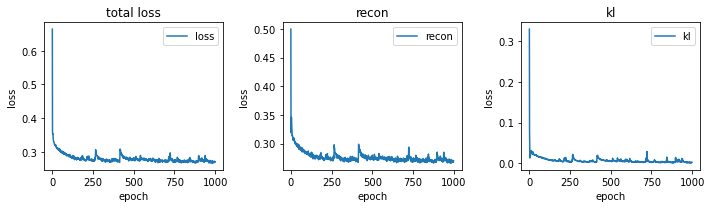

In [24]:
model_history(vae_one_channel,'kl')

In [25]:
from ipywidgets import interactive
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def viewer(index):
    check_VAE_output(mod_x_train,index,BASE_PATCH_WIDTH,encoder,decoder)


interactive_image = interactive(viewer, index = (0,x_train.shape[0]-1))
output = interactive_image.children[-1]
# output.layout.height = '300px'
interactive_image

interactive(children=(IntSlider(value=342, description='index', max=685), Output()), _dom_classes=('widget-int…

In [26]:
# plot_RAE_latent_space(mod_x_train,1/250.0, BASE_PATCH_WIDTH,regularization_type='L1',recon_type='bce', n=30, figsize=15)


    
    
    

PCA explained_variance_ratio : [0.48846573 0.10943189 0.09030066]
PCA singular_values : [676.8686  320.3755  291.02667]


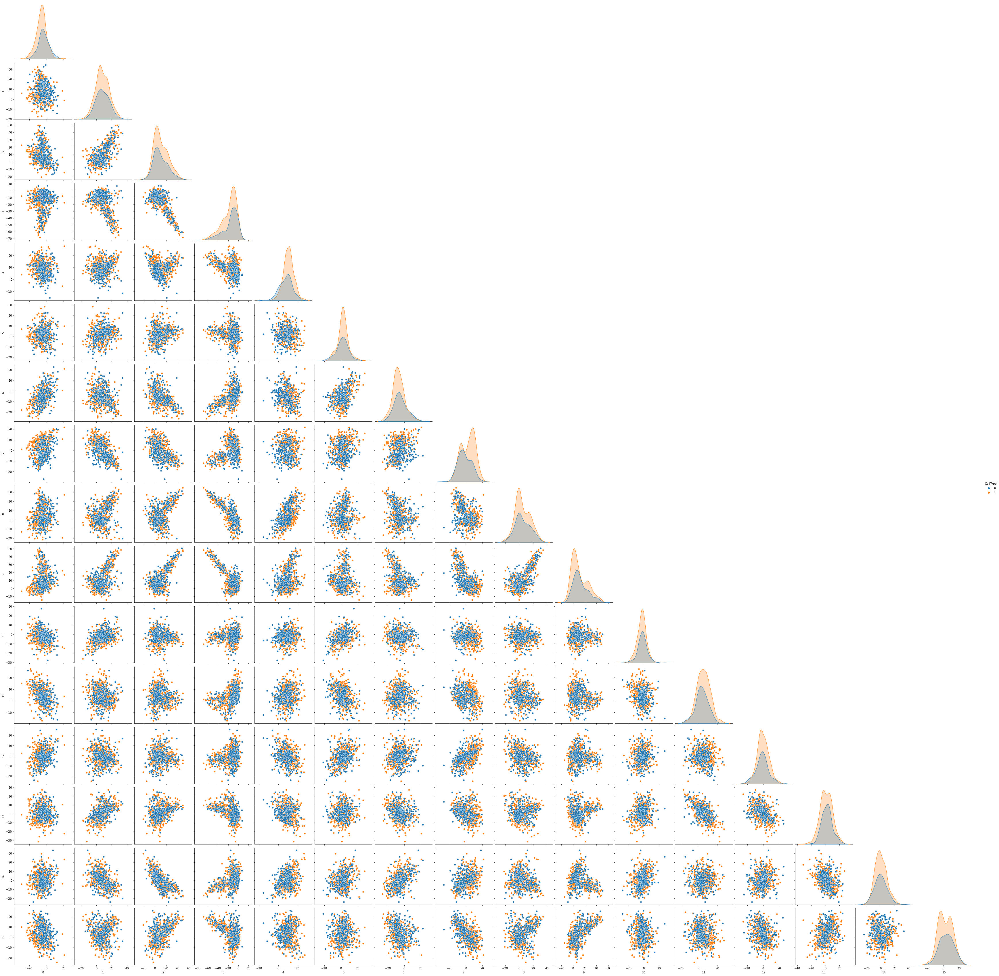

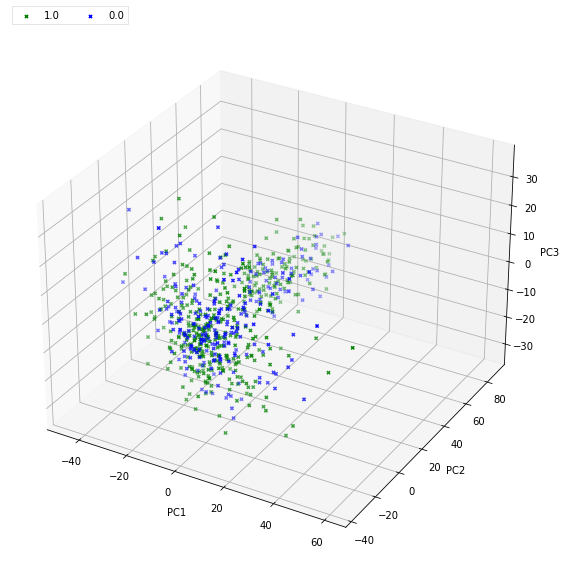

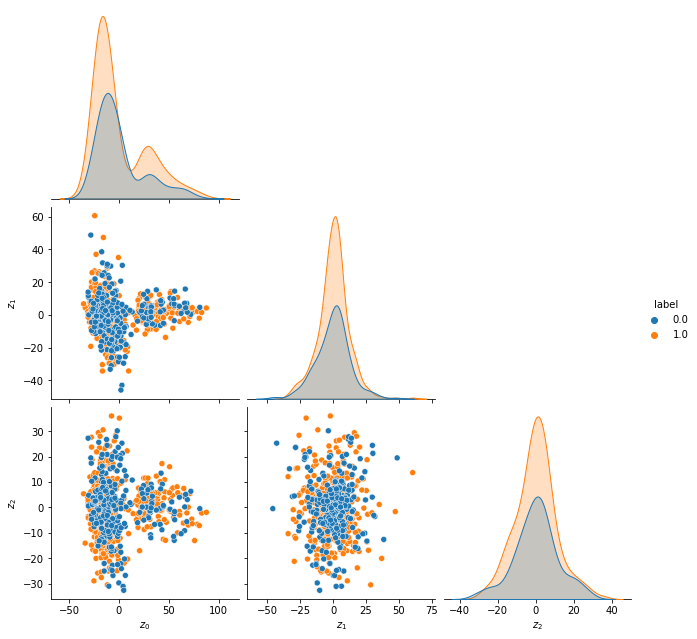

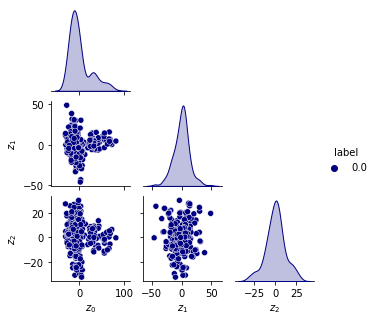

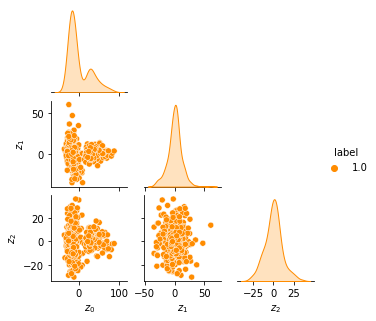

In [27]:
view_latent_variable_clusters(mod_x_train,y_train,cell_types,encoder,pairplot_height=3,PCA_flag='yes',
    PCA_figwidth=8)  

In [28]:
vae_one_channel=vae.fit(mod_x_train, epochs=10000, batch_size=128,verbose=True)  

Epoch 1/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2686 - reconstruction_loss: 0.2678 - regularization_loss: 0.0013
Epoch 2/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2684 - reconstruction_loss: 0.2679 - regularization_loss: 0.0017 
Epoch 3/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2719 - reconstruction_loss: 0.2693 - regularization_loss: 0.0024
Epoch 4/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2702 - reconstruction_loss: 0.2661 - regularization_loss: 0.0015
Epoch 5/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2677 - reconstruction_loss: 0.2706 - regularization_loss: 0.0024
Epoch 6/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2727 - reconstruction_loss: 0.2644 - regularization_loss: 0.0016
Epoch 7/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2676 - reconstruction_loss: 0.2682 - regularization_loss: 0.0020
Epoch 8/10000


6/6 [==============================] - 0s 10ms/step - loss: 0.2666 - reconstruction_loss: 0.2719 - regularization_loss: 0.0067
Epoch 116/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2730 - reconstruction_loss: 0.2729 - regularization_loss: 0.0073
Epoch 117/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2759 - reconstruction_loss: 0.2723 - regularization_loss: 0.0039
Epoch 118/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2729 - reconstruction_loss: 0.2700 - regularization_loss: 0.0042 
Epoch 119/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2765 - reconstruction_loss: 0.2712 - regularization_loss: 0.0041
Epoch 120/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2761 - reconstruction_loss: 0.2668 - regularization_loss: 0.0052
Epoch 121/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2708 - reconstruction_loss: 0.2703 - regularization_loss: 0.0029
Epoch 122/10000
6

6/6 [==============================] - 0s 9ms/step - loss: 0.2814 - reconstruction_loss: 0.2790 - regularization_loss: 0.0073
Epoch 230/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2810 - reconstruction_loss: 0.2778 - regularization_loss: 0.0082
Epoch 231/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2767 - reconstruction_loss: 0.2773 - regularization_loss: 0.0081
Epoch 232/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2830 - reconstruction_loss: 0.2778 - regularization_loss: 0.0086
Epoch 233/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2817 - reconstruction_loss: 0.2768 - regularization_loss: 0.0103
Epoch 234/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2803 - reconstruction_loss: 0.2752 - regularization_loss: 0.0062
Epoch 235/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2776 - reconstruction_loss: 0.2739 - regularization_loss: 0.0097
Epoch 236/10000
6/6

6/6 [==============================] - 0s 10ms/step - loss: 0.2696 - reconstruction_loss: 0.2712 - regularization_loss: 0.0030
Epoch 344/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2698 - reconstruction_loss: 0.2680 - regularization_loss: 0.0026
Epoch 345/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2695 - reconstruction_loss: 0.2706 - regularization_loss: 0.0028
Epoch 346/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2734 - reconstruction_loss: 0.2710 - regularization_loss: 0.0019
Epoch 347/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2691 - reconstruction_loss: 0.2688 - regularization_loss: 0.0023
Epoch 348/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2735 - reconstruction_loss: 0.2662 - regularization_loss: 0.0021
Epoch 349/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2676 - reconstruction_loss: 0.2728 - regularization_loss: 0.0036
Epoch 350/10000
6/6

6/6 [==============================] - 0s 9ms/step - loss: 0.2724 - reconstruction_loss: 0.2708 - regularization_loss: 0.0036
Epoch 458/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2728 - reconstruction_loss: 0.2704 - regularization_loss: 0.0057
Epoch 459/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2805 - reconstruction_loss: 0.2742 - regularization_loss: 0.0120
Epoch 460/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2776 - reconstruction_loss: 0.2773 - regularization_loss: 0.0074
Epoch 461/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2843 - reconstruction_loss: 0.2727 - regularization_loss: 0.0049
Epoch 462/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2763 - reconstruction_loss: 0.2739 - regularization_loss: 0.0062
Epoch 463/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2793 - reconstruction_loss: 0.2708 - regularization_loss: 0.0051
Epoch 464/10000
6/6

6/6 [==============================] - 0s 9ms/step - loss: 0.2712 - reconstruction_loss: 0.2726 - regularization_loss: 0.0035
Epoch 572/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2704 - reconstruction_loss: 0.2719 - regularization_loss: 0.0033
Epoch 573/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2712 - reconstruction_loss: 0.2675 - regularization_loss: 0.0032
Epoch 574/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2762 - reconstruction_loss: 0.2680 - regularization_loss: 0.0025
Epoch 575/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2701 - reconstruction_loss: 0.2676 - regularization_loss: 0.0021
Epoch 576/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2709 - reconstruction_loss: 0.2705 - regularization_loss: 0.0023
Epoch 577/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2675 - reconstruction_loss: 0.2708 - regularization_loss: 0.0047
Epoch 578/10000
6/6 

6/6 [==============================] - 0s 9ms/step - loss: 0.2723 - reconstruction_loss: 0.2658 - regularization_loss: 0.0017
Epoch 686/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2700 - reconstruction_loss: 0.2687 - regularization_loss: 0.0025
Epoch 687/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2673 - reconstruction_loss: 0.2663 - regularization_loss: 0.0017
Epoch 688/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2709 - reconstruction_loss: 0.2678 - regularization_loss: 0.0019
Epoch 689/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2669 - reconstruction_loss: 0.2720 - regularization_loss: 0.0019
Epoch 690/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2758 - reconstruction_loss: 0.2684 - regularization_loss: 0.0021
Epoch 691/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2630 - reconstruction_loss: 0.2685 - regularization_loss: 0.0019
Epoch 692/10000
6/6

6/6 [==============================] - 0s 10ms/step - loss: 0.2675 - reconstruction_loss: 0.2677 - regularization_loss: 0.0024
Epoch 800/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2743 - reconstruction_loss: 0.2698 - regularization_loss: 0.0018
Epoch 801/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2674 - reconstruction_loss: 0.2682 - regularization_loss: 0.0026 
Epoch 802/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2669 - reconstruction_loss: 0.2684 - regularization_loss: 0.0014
Epoch 803/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2700 - reconstruction_loss: 0.2671 - regularization_loss: 0.0025
Epoch 804/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2735 - reconstruction_loss: 0.2680 - regularization_loss: 0.0019 
Epoch 805/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2725 - reconstruction_loss: 0.2664 - regularization_loss: 0.0036
Epoch 806/10000

6/6 [==============================] - 0s 10ms/step - loss: 0.2656 - reconstruction_loss: 0.2681 - regularization_loss: 0.0018
Epoch 914/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2671 - reconstruction_loss: 0.2667 - regularization_loss: 0.0020
Epoch 915/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2675 - reconstruction_loss: 0.2665 - regularization_loss: 0.0019
Epoch 916/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2663 - reconstruction_loss: 0.2689 - regularization_loss: 0.0026
Epoch 917/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2679 - reconstruction_loss: 0.2674 - regularization_loss: 0.0014
Epoch 918/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2601 - reconstruction_loss: 0.2684 - regularization_loss: 0.0027
Epoch 919/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2683 - reconstruction_loss: 0.2663 - regularization_loss: 0.0013
Epoch 920/10000
6/

6/6 [==============================] - 0s 10ms/step - loss: 0.2672 - reconstruction_loss: 0.2731 - regularization_loss: 0.0024
Epoch 1028/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2737 - reconstruction_loss: 0.2706 - regularization_loss: 0.0105
Epoch 1029/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2812 - reconstruction_loss: 0.2794 - regularization_loss: 0.0076
Epoch 1030/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2799 - reconstruction_loss: 0.2722 - regularization_loss: 0.0094
Epoch 1031/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2768 - reconstruction_loss: 0.2728 - regularization_loss: 0.0060
Epoch 1032/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2795 - reconstruction_loss: 0.2738 - regularization_loss: 0.0063
Epoch 1033/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2724 - reconstruction_loss: 0.2736 - regularization_loss: 0.0064
Epoch 1034/

6/6 [==============================] - 0s 10ms/step - loss: 0.2794 - reconstruction_loss: 0.2758 - regularization_loss: 0.0087
Epoch 1140/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2793 - reconstruction_loss: 0.2718 - regularization_loss: 0.0064
Epoch 1141/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2757 - reconstruction_loss: 0.2721 - regularization_loss: 0.0055
Epoch 1142/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2727 - reconstruction_loss: 0.2686 - regularization_loss: 0.0038
Epoch 1143/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2755 - reconstruction_loss: 0.2679 - regularization_loss: 0.0031
Epoch 1144/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2697 - reconstruction_loss: 0.2706 - regularization_loss: 0.0036
Epoch 1145/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2721 - reconstruction_loss: 0.2703 - regularization_loss: 0.0043
Epoch 1146/

6/6 [==============================] - 0s 10ms/step - loss: 0.2675 - reconstruction_loss: 0.2628 - regularization_loss: 7.6296e-04
Epoch 1252/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2628 - reconstruction_loss: 0.2680 - regularization_loss: 0.0012
Epoch 1253/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2708 - reconstruction_loss: 0.2621 - regularization_loss: 4.9940e-04
Epoch 1254/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2651 - reconstruction_loss: 0.2649 - regularization_loss: 0.0010
Epoch 1255/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2658 - reconstruction_loss: 0.2670 - regularization_loss: 3.3060e-04
Epoch 1256/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2681 - reconstruction_loss: 0.2659 - regularization_loss: 0.0016
Epoch 1257/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2675 - reconstruction_loss: 0.2652 - regularization_loss: 0.0010


6/6 [==============================] - 0s 10ms/step - loss: 0.2702 - reconstruction_loss: 0.2702 - regularization_loss: 0.0032
Epoch 1364/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2740 - reconstruction_loss: 0.2702 - regularization_loss: 0.0126
Epoch 1365/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2850 - reconstruction_loss: 0.2777 - regularization_loss: 0.0079
Epoch 1366/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2787 - reconstruction_loss: 0.2722 - regularization_loss: 0.0066
Epoch 1367/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2770 - reconstruction_loss: 0.2708 - regularization_loss: 0.0076
Epoch 1368/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2769 - reconstruction_loss: 0.2748 - regularization_loss: 0.0044
Epoch 1369/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2743 - reconstruction_loss: 0.2742 - regularization_loss: 0.0046
Epoch 1370/1

6/6 [==============================] - 0s 10ms/step - loss: 0.2700 - reconstruction_loss: 0.2709 - regularization_loss: 0.0012
Epoch 1477/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2701 - reconstruction_loss: 0.2691 - regularization_loss: 0.0013
Epoch 1478/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2716 - reconstruction_loss: 0.2649 - regularization_loss: 0.0021
Epoch 1479/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2671 - reconstruction_loss: 0.2676 - regularization_loss: 0.0027
Epoch 1480/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2705 - reconstruction_loss: 0.2711 - regularization_loss: 0.0015
Epoch 1481/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2693 - reconstruction_loss: 0.2671 - regularization_loss: 0.0027
Epoch 1482/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2646 - reconstruction_loss: 0.2657 - regularization_loss: 5.2078e-04
Epoch 14

6/6 [==============================] - 0s 9ms/step - loss: 0.2695 - reconstruction_loss: 0.2650 - regularization_loss: 3.7030e-04
Epoch 1588/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2691 - reconstruction_loss: 0.2653 - regularization_loss: -5.9356e-04
Epoch 1589/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2652 - reconstruction_loss: 0.2641 - regularization_loss: 7.8680e-04
Epoch 1590/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2711 - reconstruction_loss: 0.2648 - regularization_loss: 5.2247e-04
Epoch 1591/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2673 - reconstruction_loss: 0.2672 - regularization_loss: 9.0403e-04
Epoch 1592/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2696 - reconstruction_loss: 0.2637 - regularization_loss: 4.4509e-04
Epoch 1593/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2666 - reconstruction_loss: 0.2621 - regularization_

6/6 [==============================] - 0s 9ms/step - loss: 0.2737 - reconstruction_loss: 0.2701 - regularization_loss: 0.0022
Epoch 1699/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2727 - reconstruction_loss: 0.2698 - regularization_loss: 0.0023
Epoch 1700/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2713 - reconstruction_loss: 0.2706 - regularization_loss: 0.0025
Epoch 1701/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2652 - reconstruction_loss: 0.2653 - regularization_loss: 0.0012
Epoch 1702/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2683 - reconstruction_loss: 0.2687 - regularization_loss: 0.0029
Epoch 1703/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2693 - reconstruction_loss: 0.2660 - regularization_loss: 0.0017
Epoch 1704/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2682 - reconstruction_loss: 0.2687 - regularization_loss: 0.0020
Epoch 1705/1

6/6 [==============================] - 0s 10ms/step - loss: 0.2651 - reconstruction_loss: 0.2603 - regularization_loss: -3.5938e-04
Epoch 1810/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2689 - reconstruction_loss: 0.2667 - regularization_loss: 1.9980e-04
Epoch 1811/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2666 - reconstruction_loss: 0.2682 - regularization_loss: 8.0667e-04
Epoch 1812/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2627 - reconstruction_loss: 0.2668 - regularization_loss: 8.7104e-04
Epoch 1813/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2663 - reconstruction_loss: 0.2679 - regularization_loss: 7.2638e-04
Epoch 1814/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2708 - reconstruction_loss: 0.2657 - regularization_loss: 0.0016
Epoch 1815/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2712 - reconstruction_loss: 0.2681 - regularization_los

6/6 [==============================] - 0s 9ms/step - loss: 0.2603 - reconstruction_loss: 0.2614 - regularization_loss: -0.0011
Epoch 1921/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2647 - regularization_loss: -6.0861e-04
Epoch 1922/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2620 - reconstruction_loss: 0.2636 - regularization_loss: -8.8795e-04
Epoch 1923/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2574 - reconstruction_loss: 0.2595 - regularization_loss: -0.0014
Epoch 1924/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2624 - reconstruction_loss: 0.2631 - regularization_loss: -7.5459e-04
Epoch 1925/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2628 - reconstruction_loss: 0.2650 - regularization_loss: -1.2942e-04
Epoch 1926/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2603 - reconstruction_loss: 0.2669 - regularization_lo

6/6 [==============================] - 0s 10ms/step - loss: 0.2682 - reconstruction_loss: 0.2630 - regularization_loss: -6.6219e-04
Epoch 2031/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2599 - reconstruction_loss: 0.2650 - regularization_loss: -0.0010
Epoch 2032/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2637 - reconstruction_loss: 0.2641 - regularization_loss: -4.3017e-04
Epoch 2033/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2641 - reconstruction_loss: 0.2643 - regularization_loss: 4.4740e-04
Epoch 2034/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2635 - reconstruction_loss: 0.2674 - regularization_loss: 0.0024
Epoch 2035/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2725 - reconstruction_loss: 0.2707 - regularization_loss: 0.0045
Epoch 2036/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2725 - reconstruction_loss: 0.2747 - regularization_loss: 0.00

6/6 [==============================] - 0s 10ms/step - loss: 0.2733 - reconstruction_loss: 0.2699 - regularization_loss: 0.0034
Epoch 2088/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2703 - reconstruction_loss: 0.2710 - regularization_loss: 0.0016
Epoch 2089/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2694 - reconstruction_loss: 0.2670 - regularization_loss: 0.0025
Epoch 2090/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2692 - reconstruction_loss: 0.2694 - regularization_loss: 0.0029
Epoch 2091/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2703 - reconstruction_loss: 0.2704 - regularization_loss: 0.0028
Epoch 2092/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2690 - reconstruction_loss: 0.2707 - regularization_loss: 0.0077
Epoch 2093/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2785 - reconstruction_loss: 0.2689 - regularization_loss: 0.0021
Epoch 2094

6/6 [==============================] - 0s 9ms/step - loss: 0.2698 - reconstruction_loss: 0.2662 - regularization_loss: 2.9188e-04
Epoch 2200/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2697 - reconstruction_loss: 0.2712 - regularization_loss: 8.5359e-04
Epoch 2201/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2643 - reconstruction_loss: 0.2640 - regularization_loss: 4.2382e-04
Epoch 2202/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2647 - reconstruction_loss: 0.2666 - regularization_loss: 4.9213e-04
Epoch 2203/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2635 - reconstruction_loss: 0.2682 - regularization_loss: 0.0013
Epoch 2204/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2673 - reconstruction_loss: 0.2653 - regularization_loss: 8.7575e-04
Epoch 2205/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2678 - reconstruction_loss: 0.2673 - regularization_loss:

6/6 [==============================] - 0s 10ms/step - loss: 0.2765 - reconstruction_loss: 0.2700 - regularization_loss: 0.0041
Epoch 2313/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2684 - reconstruction_loss: 0.2715 - regularization_loss: 0.0030
Epoch 2314/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2702 - reconstruction_loss: 0.2686 - regularization_loss: 0.0032
Epoch 2315/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2714 - reconstruction_loss: 0.2735 - regularization_loss: 0.0041
Epoch 2316/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2710 - reconstruction_loss: 0.2688 - regularization_loss: 0.0025
Epoch 2317/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2700 - reconstruction_loss: 0.2715 - regularization_loss: 0.0025
Epoch 2318/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2715 - reconstruction_loss: 0.2707 - regularization_loss: 0.0033
Epoch 2319/100

6/6 [==============================] - 0s 10ms/step - loss: 0.2672 - reconstruction_loss: 0.2658 - regularization_loss: 0.0016
Epoch 2425/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2683 - reconstruction_loss: 0.2607 - regularization_loss: 2.7370e-04
Epoch 2426/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2705 - reconstruction_loss: 0.2648 - regularization_loss: 6.6731e-04
Epoch 2427/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2684 - reconstruction_loss: 0.2679 - regularization_loss: 0.0025
Epoch 2428/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2724 - reconstruction_loss: 0.2667 - regularization_loss: 0.0039
Epoch 2429/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2693 - reconstruction_loss: 0.2719 - regularization_loss: 0.0028
Epoch 2430/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2732 - reconstruction_loss: 0.2666 - regularization_loss: 0.0023
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2721 - reconstruction_loss: 0.2701 - regularization_loss: 0.0033
Epoch 2536/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2649 - reconstruction_loss: 0.2674 - regularization_loss: 0.0038
Epoch 2537/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2755 - reconstruction_loss: 0.2691 - regularization_loss: 0.0047
Epoch 2538/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2704 - reconstruction_loss: 0.2722 - regularization_loss: 0.0033
Epoch 2539/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2726 - reconstruction_loss: 0.2681 - regularization_loss: 0.0029
Epoch 2540/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2713 - reconstruction_loss: 0.2701 - regularization_loss: 0.0026
Epoch 2541/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2692 - reconstruction_loss: 0.2667 - regularization_loss: 0.0026
Epoch 2542/1

6/6 [==============================] - 0s 9ms/step - loss: 0.2683 - reconstruction_loss: 0.2667 - regularization_loss: -1.7756e-04
Epoch 2592/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2575 - reconstruction_loss: 0.2662 - regularization_loss: -4.1608e-06
Epoch 2593/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2639 - reconstruction_loss: 0.2649 - regularization_loss: 2.3743e-04
Epoch 2594/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2632 - reconstruction_loss: 0.2612 - regularization_loss: -0.0011
Epoch 2595/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2649 - reconstruction_loss: 0.2658 - regularization_loss: 1.2491e-04
Epoch 2596/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2638 - reconstruction_loss: 0.2656 - regularization_loss: -7.2830e-04
Epoch 2597/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2603 - reconstruction_loss: 0.2661 - regularization_los

6/6 [==============================] - 0s 10ms/step - loss: 0.2672 - reconstruction_loss: 0.2659 - regularization_loss: -1.1838e-04
Epoch 2703/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2653 - reconstruction_loss: 0.2636 - regularization_loss: -5.9622e-04
Epoch 2704/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2694 - reconstruction_loss: 0.2663 - regularization_loss: -4.0135e-05
Epoch 2705/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2646 - reconstruction_loss: 0.2653 - regularization_loss: -4.3746e-04
Epoch 2706/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2624 - reconstruction_loss: 0.2631 - regularization_loss: -4.4618e-04
Epoch 2707/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2678 - reconstruction_loss: 0.2641 - regularization_loss: -3.9661e-04
Epoch 2708/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2628 - reconstruction_loss: 0.2634 - regulariza

6/6 [==============================] - 0s 10ms/step - loss: 0.2664 - reconstruction_loss: 0.2725 - regularization_loss: 0.0026
Epoch 2814/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2682 - reconstruction_loss: 0.2678 - regularization_loss: 0.0020
Epoch 2815/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2656 - reconstruction_loss: 0.2669 - regularization_loss: 8.3724e-04
Epoch 2816/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2662 - reconstruction_loss: 0.2650 - regularization_loss: 0.0014
Epoch 2817/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2680 - reconstruction_loss: 0.2646 - regularization_loss: 1.0189e-04
Epoch 2818/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2663 - reconstruction_loss: 0.2660 - regularization_loss: 8.4957e-04
Epoch 2819/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2654 - reconstruction_loss: 0.2645 - regularization_loss: 9.839

6/6 [==============================] - 0s 10ms/step - loss: 0.2636 - reconstruction_loss: 0.2625 - regularization_loss: -4.6025e-04
Epoch 2925/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2651 - reconstruction_loss: 0.2655 - regularization_loss: 3.1872e-04
Epoch 2926/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2685 - reconstruction_loss: 0.2629 - regularization_loss: -2.3843e-04
Epoch 2927/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2631 - reconstruction_loss: 0.2645 - regularization_loss: -4.3090e-04
Epoch 2928/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2694 - reconstruction_loss: 0.2636 - regularization_loss: -0.0010
Epoch 2929/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2632 - reconstruction_loss: 0.2619 - regularization_loss: -5.6853e-04
Epoch 2930/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2656 - reconstruction_loss: 0.2611 - regularization

Epoch 2980/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2630 - reconstruction_loss: 0.2645 - regularization_loss: -5.3337e-04
Epoch 2981/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2691 - reconstruction_loss: 0.2634 - regularization_loss: -8.3494e-04
Epoch 2982/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2671 - reconstruction_loss: 0.2638 - regularization_loss: -7.1208e-04
Epoch 2983/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2683 - reconstruction_loss: 0.2622 - regularization_loss: -0.0011
Epoch 2984/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2665 - reconstruction_loss: 0.2642 - regularization_loss: -5.9871e-04
Epoch 2985/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2620 - reconstruction_loss: 0.2633 - regularization_loss: -9.4314e-04
Epoch 2986/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2616 - reconstruction_loss: 0.2647 

6/6 [==============================] - 0s 9ms/step - loss: 0.2657 - reconstruction_loss: 0.2631 - regularization_loss: -6.3107e-04
Epoch 3092/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2650 - reconstruction_loss: 0.2637 - regularization_loss: -0.0010
Epoch 3093/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2641 - reconstruction_loss: 0.2634 - regularization_loss: -0.0014
Epoch 3094/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2673 - reconstruction_loss: 0.2620 - regularization_loss: -9.5694e-04
Epoch 3095/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2613 - reconstruction_loss: 0.2646 - regularization_loss: -9.7842e-04
Epoch 3096/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2620 - reconstruction_loss: 0.2629 - regularization_loss: -0.0015
Epoch 3097/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2638 - reconstruction_loss: 0.2616 - regularization_loss: -

6/6 [==============================] - 0s 10ms/step - loss: 0.2642 - reconstruction_loss: 0.2636 - regularization_loss: -8.9739e-05
Epoch 3204/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2653 - reconstruction_loss: 0.2624 - regularization_loss: -3.0416e-04
Epoch 3205/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2668 - reconstruction_loss: 0.2675 - regularization_loss: -3.7769e-05
Epoch 3206/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2649 - reconstruction_loss: 0.2645 - regularization_loss: 2.6588e-04
Epoch 3207/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2669 - reconstruction_loss: 0.2657 - regularization_loss: 1.9886e-04
Epoch 3208/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2672 - reconstruction_loss: 0.2646 - regularization_loss: 3.0593e-04
Epoch 3209/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2646 - reconstruction_loss: 0.2654 - regularizatio

6/6 [==============================] - 0s 10ms/step - loss: 0.2663 - reconstruction_loss: 0.2632 - regularization_loss: 1.5947e-04
Epoch 3314/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2625 - reconstruction_loss: 0.2638 - regularization_loss: -2.1275e-04
Epoch 3315/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2655 - reconstruction_loss: 0.2639 - regularization_loss: 0.0075
Epoch 3316/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2708 - reconstruction_loss: 0.2666 - regularization_loss: 0.0039
Epoch 3317/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2697 - reconstruction_loss: 0.2716 - regularization_loss: 6.5120e-04
Epoch 3318/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2639 - reconstruction_loss: 0.2670 - regularization_loss: 0.0024
Epoch 3319/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2704 - reconstruction_loss: 0.2670 - regularization_loss: 0.002

6/6 [==============================] - 0s 9ms/step - loss: 0.2578 - reconstruction_loss: 0.2615 - regularization_loss: -0.0024
Epoch 3425/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2627 - reconstruction_loss: 0.2603 - regularization_loss: -0.0021
Epoch 3426/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2587 - reconstruction_loss: 0.2634 - regularization_loss: -0.0017
Epoch 3427/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2631 - reconstruction_loss: 0.2610 - regularization_loss: -0.0021
Epoch 3428/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2586 - reconstruction_loss: 0.2631 - regularization_loss: -0.0015
Epoch 3429/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2643 - reconstruction_loss: 0.2644 - regularization_loss: -0.0012
Epoch 3430/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2578 - reconstruction_loss: 0.2649 - regularization_loss: -0.0011
Epoch 34

6/6 [==============================] - 0s 10ms/step - loss: 0.2704 - reconstruction_loss: 0.2624 - regularization_loss: 5.0467e-04
Epoch 3537/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2647 - reconstruction_loss: 0.2647 - regularization_loss: 8.3594e-04
Epoch 3538/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2670 - reconstruction_loss: 0.2673 - regularization_loss: 6.6910e-04
Epoch 3539/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2663 - reconstruction_loss: 0.2645 - regularization_loss: 1.0408e-05
Epoch 3540/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2632 - reconstruction_loss: 0.2644 - regularization_loss: 4.0682e-04
Epoch 3541/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2605 - reconstruction_loss: 0.2637 - regularization_loss: 4.1668e-04
Epoch 3542/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2658 - reconstruction_loss: 0.2671 - regularization_l

6/6 [==============================] - 0s 10ms/step - loss: 0.2655 - reconstruction_loss: 0.2662 - regularization_loss: 1.0049e-04
Epoch 3593/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2651 - reconstruction_loss: 0.2637 - regularization_loss: -6.8011e-05
Epoch 3594/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2616 - reconstruction_loss: 0.2647 - regularization_loss: -5.7640e-04
Epoch 3595/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2683 - reconstruction_loss: 0.2665 - regularization_loss: -5.3567e-04
Epoch 3596/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2649 - reconstruction_loss: 0.2636 - regularization_loss: -4.2479e-04
Epoch 3597/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2619 - reconstruction_loss: 0.2632 - regularization_loss: -8.4336e-04
Epoch 3598/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2650 - reconstruction_loss: 0.2627 - regulariza

6/6 [==============================] - 0s 9ms/step - loss: 0.2625 - reconstruction_loss: 0.2624 - regularization_loss: -0.0017
Epoch 3704/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2643 - reconstruction_loss: 0.2606 - regularization_loss: -0.0016
Epoch 3705/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2611 - reconstruction_loss: 0.2661 - regularization_loss: -8.2762e-04
Epoch 3706/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2644 - reconstruction_loss: 0.2610 - regularization_loss: -0.0020
Epoch 3707/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2627 - reconstruction_loss: 0.2666 - regularization_loss: -5.3025e-04
Epoch 3708/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2589 - reconstruction_loss: 0.2611 - regularization_loss: -0.0017
Epoch 3709/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2652 - reconstruction_loss: 0.2647 - regularization_loss: -0.001

6/6 [==============================] - 0s 10ms/step - loss: 0.2575 - reconstruction_loss: 0.2636 - regularization_loss: -0.0016
Epoch 3816/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2568 - reconstruction_loss: 0.2638 - regularization_loss: -0.0014
Epoch 3817/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2633 - reconstruction_loss: 0.2619 - regularization_loss: -8.3367e-04
Epoch 3818/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2660 - reconstruction_loss: 0.2629 - regularization_loss: -0.0014
Epoch 3819/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2622 - reconstruction_loss: 0.2641 - regularization_loss: -0.0013
Epoch 3820/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2669 - reconstruction_loss: 0.2663 - regularization_loss: 0.0134
Epoch 3821/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2902 - reconstruction_loss: 0.2839 - regularization_loss: 0.0108
Ep

6/6 [==============================] - 0s 10ms/step - loss: 0.2820 - reconstruction_loss: 0.2701 - regularization_loss: 0.0037
Epoch 3928/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2728 - reconstruction_loss: 0.2718 - regularization_loss: 0.0066
Epoch 3929/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2731 - reconstruction_loss: 0.2736 - regularization_loss: 0.0025
Epoch 3930/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2736 - reconstruction_loss: 0.2694 - regularization_loss: 0.0049
Epoch 3931/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2708 - reconstruction_loss: 0.2711 - regularization_loss: 0.0022
Epoch 3932/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2731 - reconstruction_loss: 0.2698 - regularization_loss: 0.0040
Epoch 3933/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2689 - reconstruction_loss: 0.2676 - regularization_loss: 0.0030
Epoch 3934

6/6 [==============================] - 0s 9ms/step - loss: 0.2599 - reconstruction_loss: 0.2655 - regularization_loss: -4.7811e-04
Epoch 3984/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2644 - reconstruction_loss: 0.2657 - regularization_loss: -0.0010
Epoch 3985/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2639 - reconstruction_loss: 0.2638 - regularization_loss: -0.0016
Epoch 3986/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2629 - reconstruction_loss: 0.2641 - regularization_loss: -0.0010
Epoch 3987/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2629 - reconstruction_loss: 0.2642 - regularization_loss: -0.0010
Epoch 3988/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2616 - reconstruction_loss: 0.2659 - regularization_loss: -0.0010
Epoch 3989/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2623 - reconstruction_loss: 0.2653 - regularization_loss: -0.0010
E

6/6 [==============================] - 0s 9ms/step - loss: 0.2612 - reconstruction_loss: 0.2646 - regularization_loss: 3.9999e-04
Epoch 4096/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2633 - reconstruction_loss: 0.2656 - regularization_loss: -6.2667e-04
Epoch 4097/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2639 - reconstruction_loss: 0.2624 - regularization_loss: -7.5316e-04
Epoch 4098/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2640 - reconstruction_loss: 0.2633 - regularization_loss: -0.0011
Epoch 4099/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2641 - reconstruction_loss: 0.2635 - regularization_loss: -0.0010
Epoch 4100/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2610 - reconstruction_loss: 0.2640 - regularization_loss: -0.0011
Epoch 4101/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2616 - reconstruction_loss: 0.2622 - regularization_loss: -

6/6 [==============================] - 0s 9ms/step - loss: 0.2613 - reconstruction_loss: 0.2623 - regularization_loss: -5.4161e-05
Epoch 4208/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2664 - reconstruction_loss: 0.2643 - regularization_loss: -6.1131e-04
Epoch 4209/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2641 - reconstruction_loss: 0.2625 - regularization_loss: -6.7742e-04
Epoch 4210/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2645 - reconstruction_loss: 0.2628 - regularization_loss: -3.3222e-04
Epoch 4211/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2648 - reconstruction_loss: 0.2650 - regularization_loss: -6.0842e-04
Epoch 4212/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2637 - reconstruction_loss: 0.2628 - regularization_loss: -9.4180e-04
Epoch 4213/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2610 - reconstruction_loss: 0.2674 - regularizat

6/6 [==============================] - 0s 10ms/step - loss: 0.2622 - reconstruction_loss: 0.2629 - regularization_loss: -0.0015
Epoch 4320/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2594 - reconstruction_loss: 0.2608 - regularization_loss: -0.0020
Epoch 4321/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2619 - reconstruction_loss: 0.2615 - regularization_loss: -0.0014
Epoch 4322/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2598 - reconstruction_loss: 0.2638 - regularization_loss: 7.1118e-04
Epoch 4323/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2631 - regularization_loss: 7.3366e-04
Epoch 4324/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2665 - reconstruction_loss: 0.2641 - regularization_loss: 6.2507e-04
Epoch 4325/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2667 - reconstruction_loss: 0.2653 - regularization_loss: -2.57

6/6 [==============================] - 0s 9ms/step - loss: 0.2599 - reconstruction_loss: 0.2598 - regularization_loss: -0.0026
Epoch 4432/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2556 - reconstruction_loss: 0.2665 - regularization_loss: -0.0020
Epoch 4433/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2588 - reconstruction_loss: 0.2637 - regularization_loss: -0.0022
Epoch 4434/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2614 - reconstruction_loss: 0.2590 - regularization_loss: -0.0022
Epoch 4435/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2652 - reconstruction_loss: 0.2601 - regularization_loss: -0.0026
Epoch 4436/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2587 - reconstruction_loss: 0.2664 - regularization_loss: -0.0023
Epoch 4437/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2552 - reconstruction_loss: 0.2588 - regularization_loss: -0.0030
Epoch 44

6/6 [==============================] - 0s 10ms/step - loss: 0.2607 - reconstruction_loss: 0.2609 - regularization_loss: -5.0396e-04
Epoch 4544/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2601 - reconstruction_loss: 0.2616 - regularization_loss: -1.1001e-04
Epoch 4545/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2684 - reconstruction_loss: 0.2655 - regularization_loss: 1.5384e-04
Epoch 4546/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2660 - reconstruction_loss: 0.2652 - regularization_loss: 9.1188e-04
Epoch 4547/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2651 - reconstruction_loss: 0.2663 - regularization_loss: 0.0048
Epoch 4548/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2754 - reconstruction_loss: 0.2663 - regularization_loss: 0.0031
Epoch 4549/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2747 - reconstruction_loss: 0.2684 - regularization_loss: 0.

6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2611 - regularization_loss: -0.0017
Epoch 4656/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2669 - reconstruction_loss: 0.2628 - regularization_loss: -0.0017
Epoch 4657/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2638 - reconstruction_loss: 0.2631 - regularization_loss: -0.0014
Epoch 4658/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2640 - reconstruction_loss: 0.2610 - regularization_loss: -0.0017
Epoch 4659/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2608 - reconstruction_loss: 0.2663 - regularization_loss: -0.0013
Epoch 4660/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2648 - reconstruction_loss: 0.2613 - regularization_loss: -0.0021
Epoch 4661/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2598 - reconstruction_loss: 0.2633 - regularization_loss: -0.0016
Epo

6/6 [==============================] - 0s 9ms/step - loss: 0.2624 - reconstruction_loss: 0.2630 - regularization_loss: -0.0016
Epoch 4768/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2647 - reconstruction_loss: 0.2622 - regularization_loss: -0.0021
Epoch 4769/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2602 - reconstruction_loss: 0.2618 - regularization_loss: -0.0016
Epoch 4770/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2634 - reconstruction_loss: 0.2610 - regularization_loss: -0.0029
Epoch 4771/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2604 - reconstruction_loss: 0.2641 - regularization_loss: -8.7530e-04
Epoch 4772/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2596 - reconstruction_loss: 0.2640 - regularization_loss: -0.0017
Epoch 4773/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2574 - reconstruction_loss: 0.2600 - regularization_loss: -0.0022

6/6 [==============================] - 0s 10ms/step - loss: 0.2592 - reconstruction_loss: 0.2577 - regularization_loss: -0.0034
Epoch 4880/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2602 - reconstruction_loss: 0.2631 - regularization_loss: -0.0022
Epoch 4881/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2591 - reconstruction_loss: 0.2594 - regularization_loss: -0.0029
Epoch 4882/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2613 - regularization_loss: -0.0026
Epoch 4883/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2580 - reconstruction_loss: 0.2611 - regularization_loss: -0.0021
Epoch 4884/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2592 - regularization_loss: -0.0026
Epoch 4885/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2607 - reconstruction_loss: 0.2581 - regularization_loss: -0.0029
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2588 - reconstruction_loss: 0.2593 - regularization_loss: -0.0022
Epoch 4992/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2638 - reconstruction_loss: 0.2622 - regularization_loss: -0.0022
Epoch 4993/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2591 - reconstruction_loss: 0.2642 - regularization_loss: -0.0027
Epoch 4994/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2643 - reconstruction_loss: 0.2601 - regularization_loss: -0.0022
Epoch 4995/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2626 - regularization_loss: -0.0030
Epoch 4996/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2592 - reconstruction_loss: 0.2616 - regularization_loss: -0.0022
Epoch 4997/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2594 - reconstruction_loss: 0.2612 - regularization_loss: -0.0021
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2529 - reconstruction_loss: 0.2611 - regularization_loss: -0.0036
Epoch 5104/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2580 - reconstruction_loss: 0.2605 - regularization_loss: -0.0032
Epoch 5105/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2558 - reconstruction_loss: 0.2610 - regularization_loss: -0.0027
Epoch 5106/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2560 - reconstruction_loss: 0.2596 - regularization_loss: -0.0037
Epoch 5107/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2571 - reconstruction_loss: 0.2593 - regularization_loss: -0.0036
Epoch 5108/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2576 - reconstruction_loss: 0.2598 - regularization_loss: -0.0036
Epoch 5109/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2592 - reconstruction_loss: 0.2580 - regularization_loss: -0.0037
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2630 - regularization_loss: -9.6697e-04
Epoch 5216/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2624 - reconstruction_loss: 0.2611 - regularization_loss: -0.0016
Epoch 5217/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2642 - reconstruction_loss: 0.2677 - regularization_loss: -2.7205e-04
Epoch 5218/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2574 - reconstruction_loss: 0.2607 - regularization_loss: -7.4231e-04
Epoch 5219/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2662 - reconstruction_loss: 0.2602 - regularization_loss: -0.0014
Epoch 5220/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2715 - reconstruction_loss: 0.2623 - regularization_loss: -0.0012
Epoch 5221/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2574 - reconstruction_loss: 0.2617 - regularization_loss: 

6/6 [==============================] - 0s 9ms/step - loss: 0.2588 - reconstruction_loss: 0.2617 - regularization_loss: -0.0023
Epoch 5328/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2589 - reconstruction_loss: 0.2605 - regularization_loss: -0.0026
Epoch 5329/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2572 - reconstruction_loss: 0.2587 - regularization_loss: -0.0027
Epoch 5330/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2604 - reconstruction_loss: 0.2621 - regularization_loss: -0.0022
Epoch 5331/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2614 - regularization_loss: -0.0027
Epoch 5332/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2601 - reconstruction_loss: 0.2602 - regularization_loss: -0.0034
Epoch 5333/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2661 - reconstruction_loss: 0.2607 - regularization_loss: -0.0020
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2575 - reconstruction_loss: 0.2583 - regularization_loss: -0.0024
Epoch 5440/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2637 - reconstruction_loss: 0.2594 - regularization_loss: -0.0031
Epoch 5441/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2610 - reconstruction_loss: 0.2587 - regularization_loss: -0.0028
Epoch 5442/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2558 - reconstruction_loss: 0.2644 - regularization_loss: -0.0026
Epoch 5443/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2593 - regularization_loss: -0.0022
Epoch 5444/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2637 - reconstruction_loss: 0.2609 - regularization_loss: -0.0026
Epoch 5445/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2559 - reconstruction_loss: 0.2644 - regularization_loss: -0.0018
Epo

6/6 [==============================] - 0s 10ms/step - loss: 0.2619 - reconstruction_loss: 0.2586 - regularization_loss: -0.0030
Epoch 5552/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2575 - reconstruction_loss: 0.2576 - regularization_loss: -0.0037
Epoch 5553/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2589 - reconstruction_loss: 0.2613 - regularization_loss: -0.0028
Epoch 5554/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2579 - reconstruction_loss: 0.2601 - regularization_loss: -0.0037
Epoch 5555/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2611 - regularization_loss: -0.0024
Epoch 5556/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2597 - reconstruction_loss: 0.2622 - regularization_loss: -0.0024
Epoch 5557/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2574 - reconstruction_loss: 0.2574 - regularization_loss: -0.0033
Epoch

6/6 [==============================] - 0s 9ms/step - loss: 0.2596 - reconstruction_loss: 0.2612 - regularization_loss: -4.2086e-04
Epoch 5664/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2598 - reconstruction_loss: 0.2619 - regularization_loss: -8.1760e-04
Epoch 5665/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2656 - reconstruction_loss: 0.2591 - regularization_loss: -0.0014
Epoch 5666/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2609 - reconstruction_loss: 0.2621 - regularization_loss: -0.0019
Epoch 5667/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2611 - reconstruction_loss: 0.2623 - regularization_loss: -0.0015
Epoch 5668/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2599 - reconstruction_loss: 0.2623 - regularization_loss: -0.0018
Epoch 5669/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2632 - reconstruction_loss: 0.2628 - regularization_loss: -0.0

6/6 [==============================] - 0s 9ms/step - loss: 0.2587 - reconstruction_loss: 0.2572 - regularization_loss: -0.0034
Epoch 5776/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2570 - reconstruction_loss: 0.2610 - regularization_loss: -0.0033
Epoch 5777/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2585 - reconstruction_loss: 0.2608 - regularization_loss: -0.0033
Epoch 5778/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2581 - reconstruction_loss: 0.2583 - regularization_loss: -0.0036
Epoch 5779/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2622 - regularization_loss: -0.0029
Epoch 5780/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2581 - reconstruction_loss: 0.2584 - regularization_loss: -0.0034
Epoch 5781/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2563 - reconstruction_loss: 0.2629 - regularization_loss: -0.0026
Epoch 

6/6 [==============================] - 0s 10ms/step - loss: 0.2549 - reconstruction_loss: 0.2592 - regularization_loss: -0.0029
Epoch 5888/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2566 - reconstruction_loss: 0.2601 - regularization_loss: -0.0033
Epoch 5889/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2643 - regularization_loss: -0.0029
Epoch 5890/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2592 - reconstruction_loss: 0.2573 - regularization_loss: -0.0035
Epoch 5891/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2589 - reconstruction_loss: 0.2603 - regularization_loss: -0.0036
Epoch 5892/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2604 - regularization_loss: -0.0038
Epoch 5893/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2588 - reconstruction_loss: 0.2599 - regularization_loss: -0.0039
Epoch

6/6 [==============================] - 0s 9ms/step - loss: 0.2571 - reconstruction_loss: 0.2614 - regularization_loss: -0.0024
Epoch 6000/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2602 - regularization_loss: -0.0030
Epoch 6001/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2526 - reconstruction_loss: 0.2602 - regularization_loss: -0.0034
Epoch 6002/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2545 - reconstruction_loss: 0.2596 - regularization_loss: -0.0031
Epoch 6003/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2587 - regularization_loss: -0.0031
Epoch 6004/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2576 - reconstruction_loss: 0.2601 - regularization_loss: -0.0035
Epoch 6005/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2570 - reconstruction_loss: 0.2611 - regularization_loss: -0.0035
Epoch 6

6/6 [==============================] - 0s 9ms/step - loss: 0.2564 - reconstruction_loss: 0.2631 - regularization_loss: -0.0020
Epoch 6112/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2590 - reconstruction_loss: 0.2612 - regularization_loss: -0.0026
Epoch 6113/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2561 - reconstruction_loss: 0.2597 - regularization_loss: -0.0031
Epoch 6114/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2600 - reconstruction_loss: 0.2598 - regularization_loss: -0.0031
Epoch 6115/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2565 - reconstruction_loss: 0.2596 - regularization_loss: -0.0030
Epoch 6116/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2635 - reconstruction_loss: 0.2621 - regularization_loss: -0.0027
Epoch 6117/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2623 - reconstruction_loss: 0.2590 - regularization_loss: -0.0029
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2604 - reconstruction_loss: 0.2589 - regularization_loss: -0.0041
Epoch 6224/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2586 - reconstruction_loss: 0.2580 - regularization_loss: -0.0040
Epoch 6225/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2589 - reconstruction_loss: 0.2577 - regularization_loss: -0.0035
Epoch 6226/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2537 - reconstruction_loss: 0.2575 - regularization_loss: -0.0040
Epoch 6227/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2548 - reconstruction_loss: 0.2616 - regularization_loss: -0.0039
Epoch 6228/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2620 - reconstruction_loss: 0.2599 - regularization_loss: -0.0030
Epoch 6229/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2536 - reconstruction_loss: 0.2624 - regularization_loss: -0.0041
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2535 - reconstruction_loss: 0.2593 - regularization_loss: -0.0040
Epoch 6336/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2537 - reconstruction_loss: 0.2599 - regularization_loss: -0.0032
Epoch 6337/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2592 - reconstruction_loss: 0.2582 - regularization_loss: -0.0038
Epoch 6338/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2611 - reconstruction_loss: 0.2605 - regularization_loss: -0.0036
Epoch 6339/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2576 - reconstruction_loss: 0.2566 - regularization_loss: -0.0041
Epoch 6340/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2573 - reconstruction_loss: 0.2594 - regularization_loss: -0.0039
Epoch 6341/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2569 - reconstruction_loss: 0.2579 - regularization_loss: -0.0045
Ep

6/6 [==============================] - 0s 9ms/step - loss: 0.2583 - reconstruction_loss: 0.2576 - regularization_loss: -0.0037
Epoch 6448/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2555 - reconstruction_loss: 0.2613 - regularization_loss: -0.0038
Epoch 6449/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2565 - reconstruction_loss: 0.2606 - regularization_loss: -0.0035
Epoch 6450/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2566 - reconstruction_loss: 0.2612 - regularization_loss: -0.0046
Epoch 6451/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2587 - reconstruction_loss: 0.2573 - regularization_loss: -0.0039
Epoch 6452/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2560 - reconstruction_loss: 0.2585 - regularization_loss: -0.0041
Epoch 6453/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2521 - reconstruction_loss: 0.2589 - regularization_loss: -0.0033
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2611 - reconstruction_loss: 0.2581 - regularization_loss: -0.0033
Epoch 6560/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2588 - reconstruction_loss: 0.2615 - regularization_loss: -0.0025
Epoch 6561/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2555 - reconstruction_loss: 0.2599 - regularization_loss: -0.0037
Epoch 6562/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2622 - reconstruction_loss: 0.2589 - regularization_loss: -0.0037
Epoch 6563/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2578 - reconstruction_loss: 0.2572 - regularization_loss: -0.0037
Epoch 6564/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2633 - reconstruction_loss: 0.2590 - regularization_loss: -0.0032
Epoch 6565/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2613 - reconstruction_loss: 0.2611 - regularization_loss: -0.0037
Epoch 

6/6 [==============================] - 0s 9ms/step - loss: 0.2538 - reconstruction_loss: 0.2589 - regularization_loss: -0.0038
Epoch 6672/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2548 - reconstruction_loss: 0.2576 - regularization_loss: -0.0031
Epoch 6673/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2568 - reconstruction_loss: 0.2577 - regularization_loss: -0.0032
Epoch 6674/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2592 - reconstruction_loss: 0.2618 - regularization_loss: -0.0032
Epoch 6675/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2571 - reconstruction_loss: 0.2576 - regularization_loss: -0.0042
Epoch 6676/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2618 - reconstruction_loss: 0.2606 - regularization_loss: -0.0032
Epoch 6677/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2606 - reconstruction_loss: 0.2603 - regularization_loss: -0.0033
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2663 - reconstruction_loss: 0.2722 - regularization_loss: 0.0036
Epoch 6784/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2747 - reconstruction_loss: 0.2679 - regularization_loss: 0.0045
Epoch 6785/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2677 - reconstruction_loss: 0.2703 - regularization_loss: 0.0043
Epoch 6786/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2757 - reconstruction_loss: 0.2694 - regularization_loss: 0.0039
Epoch 6787/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2686 - reconstruction_loss: 0.2695 - regularization_loss: 0.0042 
Epoch 6788/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2696 - reconstruction_loss: 0.2700 - regularization_loss: 0.0026
Epoch 6789/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2680 - reconstruction_loss: 0.2682 - regularization_loss: 0.0024
Epoch 6790

Epoch 6840/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2667 - reconstruction_loss: 0.2695 - regularization_loss: 0.0026
Epoch 6841/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2684 - reconstruction_loss: 0.2672 - regularization_loss: 0.0025
Epoch 6842/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2692 - reconstruction_loss: 0.2671 - regularization_loss: 0.0017
Epoch 6843/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2740 - reconstruction_loss: 0.2676 - regularization_loss: 0.0021
Epoch 6844/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2694 - reconstruction_loss: 0.2659 - regularization_loss: 7.3577e-04
Epoch 6845/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2718 - reconstruction_loss: 0.2662 - regularization_loss: 0.0030
Epoch 6846/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2678 - reconstruction_loss: 0.2687 - regularization_los

6/6 [==============================] - 0s 10ms/step - loss: 0.2703 - reconstruction_loss: 0.2688 - regularization_loss: 0.0067
Epoch 6951/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2656 - reconstruction_loss: 0.2742 - regularization_loss: 0.0012
Epoch 6952/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2681 - reconstruction_loss: 0.2699 - regularization_loss: 0.0036
Epoch 6953/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2658 - reconstruction_loss: 0.2688 - regularization_loss: 0.0022
Epoch 6954/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2657 - reconstruction_loss: 0.2689 - regularization_loss: 0.0016
Epoch 6955/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2748 - reconstruction_loss: 0.2668 - regularization_loss: 0.0045
Epoch 6956/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2678 - reconstruction_loss: 0.2690 - regularization_loss: 1.3558e-04
Epoch 

6/6 [==============================] - 0s 10ms/step - loss: 0.2640 - reconstruction_loss: 0.2634 - regularization_loss: -7.4256e-04
Epoch 7007/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2646 - reconstruction_loss: 0.2654 - regularization_loss: -7.4364e-04
Epoch 7008/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2567 - reconstruction_loss: 0.2616 - regularization_loss: -0.0012
Epoch 7009/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2624 - reconstruction_loss: 0.2635 - regularization_loss: -0.0012
Epoch 7010/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2628 - reconstruction_loss: 0.2622 - regularization_loss: -8.8816e-04
Epoch 7011/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2655 - reconstruction_loss: 0.2635 - regularization_loss: -3.5949e-04
Epoch 7012/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2665 - reconstruction_loss: 0.2642 - regularization_los

6/6 [==============================] - 0s 10ms/step - loss: 0.2580 - reconstruction_loss: 0.2621 - regularization_loss: -0.0014
Epoch 7119/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2528 - reconstruction_loss: 0.2633 - regularization_loss: -0.0020
Epoch 7120/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2579 - reconstruction_loss: 0.2639 - regularization_loss: -0.0020
Epoch 7121/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2619 - reconstruction_loss: 0.2665 - regularization_loss: -0.0013
Epoch 7122/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2602 - reconstruction_loss: 0.2619 - regularization_loss: -0.0017
Epoch 7123/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2548 - reconstruction_loss: 0.2667 - regularization_loss: -0.0015
Epoch 7124/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2646 - reconstruction_loss: 0.2617 - regularization_loss: -0.0022
Epo

6/6 [==============================] - 0s 9ms/step - loss: 0.2605 - reconstruction_loss: 0.2599 - regularization_loss: -0.0024
Epoch 7231/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2610 - reconstruction_loss: 0.2575 - regularization_loss: -0.0028
Epoch 7232/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2573 - reconstruction_loss: 0.2603 - regularization_loss: -0.0022
Epoch 7233/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2610 - reconstruction_loss: 0.2614 - regularization_loss: -0.0025
Epoch 7234/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2640 - reconstruction_loss: 0.2621 - regularization_loss: -0.0019
Epoch 7235/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2629 - reconstruction_loss: 0.2631 - regularization_loss: -0.0020
Epoch 7236/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2609 - reconstruction_loss: 0.2612 - regularization_loss: -0.0023
Epoch 7

6/6 [==============================] - 0s 9ms/step - loss: 0.2620 - reconstruction_loss: 0.2641 - regularization_loss: -0.0021
Epoch 7342/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2598 - reconstruction_loss: 0.2620 - regularization_loss: -0.0018
Epoch 7343/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2656 - reconstruction_loss: 0.2610 - regularization_loss: -0.0020
Epoch 7344/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2654 - reconstruction_loss: 0.2612 - regularization_loss: -0.0012
Epoch 7345/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2636 - reconstruction_loss: 0.2622 - regularization_loss: -9.0858e-04
Epoch 7346/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2612 - reconstruction_loss: 0.2603 - regularization_loss: -0.0023
Epoch 7347/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2596 - reconstruction_loss: 0.2616 - regularization_loss: -0.0020
Ep

6/6 [==============================] - 0s 8ms/step - loss: 0.2655 - reconstruction_loss: 0.2664 - regularization_loss: 9.6283e-04
Epoch 7454/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2651 - reconstruction_loss: 0.2673 - regularization_loss: 0.0017
Epoch 7455/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2674 - reconstruction_loss: 0.2712 - regularization_loss: 0.0011
Epoch 7456/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2680 - reconstruction_loss: 0.2693 - regularization_loss: 0.0018
Epoch 7457/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2664 - reconstruction_loss: 0.2679 - regularization_loss: 0.0014
Epoch 7458/10000
6/6 [==============================] - 0s 8ms/step - loss: 0.2632 - reconstruction_loss: 0.2678 - regularization_loss: 0.0010
Epoch 7459/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2634 - reconstruction_loss: 0.2690 - regularization_loss: 0.0031
Epoch 7460/1

Epoch 7509/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2636 - reconstruction_loss: 0.2615 - regularization_loss: -0.0014
Epoch 7510/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2632 - reconstruction_loss: 0.2628 - regularization_loss: -0.0012
Epoch 7511/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2602 - reconstruction_loss: 0.2624 - regularization_loss: -0.0018
Epoch 7512/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2626 - reconstruction_loss: 0.2599 - regularization_loss: -0.0022
Epoch 7513/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2616 - reconstruction_loss: 0.2620 - regularization_loss: -0.0012
Epoch 7514/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2620 - reconstruction_loss: 0.2650 - regularization_loss: -7.1809e-04
Epoch 7515/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2628 - reconstruction_loss: 0.2647 - regularizati

6/6 [==============================] - 0s 10ms/step - loss: 0.2595 - reconstruction_loss: 0.2607 - regularization_loss: -0.0024
Epoch 7622/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2582 - reconstruction_loss: 0.2624 - regularization_loss: -0.0019
Epoch 7623/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2650 - reconstruction_loss: 0.2579 - regularization_loss: -0.0022
Epoch 7624/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2617 - reconstruction_loss: 0.2601 - regularization_loss: -0.0017
Epoch 7625/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2592 - reconstruction_loss: 0.2637 - regularization_loss: -0.0019
Epoch 7626/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2597 - reconstruction_loss: 0.2613 - regularization_loss: -0.0024
Epoch 7627/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2596 - reconstruction_loss: 0.2643 - regularization_loss: -0.0018
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2612 - reconstruction_loss: 0.2624 - regularization_loss: -0.0026
Epoch 7734/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2571 - reconstruction_loss: 0.2591 - regularization_loss: -0.0023
Epoch 7735/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2536 - reconstruction_loss: 0.2594 - regularization_loss: -0.0027
Epoch 7736/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2590 - regularization_loss: -0.0026
Epoch 7737/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2634 - reconstruction_loss: 0.2603 - regularization_loss: -0.0022
Epoch 7738/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2611 - reconstruction_loss: 0.2611 - regularization_loss: -0.0030
Epoch 7739/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2645 - reconstruction_loss: 0.2624 - regularization_loss: -0.0025
Epoc

6/6 [==============================] - 0s 9ms/step - loss: 0.2580 - reconstruction_loss: 0.2605 - regularization_loss: -0.0022
Epoch 7846/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2654 - reconstruction_loss: 0.2618 - regularization_loss: -0.0021
Epoch 7847/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2647 - reconstruction_loss: 0.2595 - regularization_loss: -0.0027
Epoch 7848/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2590 - reconstruction_loss: 0.2626 - regularization_loss: -0.0020
Epoch 7849/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2612 - reconstruction_loss: 0.2608 - regularization_loss: -0.0018
Epoch 7850/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2565 - reconstruction_loss: 0.2654 - regularization_loss: -0.0019
Epoch 7851/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2594 - reconstruction_loss: 0.2598 - regularization_loss: -0.0016
Epoch 7

6/6 [==============================] - 0s 9ms/step - loss: 0.2629 - reconstruction_loss: 0.2614 - regularization_loss: -0.0023
Epoch 7958/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2638 - reconstruction_loss: 0.2608 - regularization_loss: -0.0026
Epoch 7959/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2614 - reconstruction_loss: 0.2612 - regularization_loss: -0.0021
Epoch 7960/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2642 - reconstruction_loss: 0.2613 - regularization_loss: -0.0023
Epoch 7961/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2613 - reconstruction_loss: 0.2612 - regularization_loss: -0.0022
Epoch 7962/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2613 - reconstruction_loss: 0.2607 - regularization_loss: -0.0025
Epoch 7963/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2661 - reconstruction_loss: 0.2642 - regularization_loss: -0.0020
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2596 - reconstruction_loss: 0.2627 - regularization_loss: -0.0028
Epoch 8070/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2599 - reconstruction_loss: 0.2590 - regularization_loss: -0.0026
Epoch 8071/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2594 - reconstruction_loss: 0.2606 - regularization_loss: -0.0026
Epoch 8072/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2601 - reconstruction_loss: 0.2621 - regularization_loss: -0.0027
Epoch 8073/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2650 - reconstruction_loss: 0.2579 - regularization_loss: -0.0031
Epoch 8074/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2562 - reconstruction_loss: 0.2603 - regularization_loss: -0.0030
Epoch 8075/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2554 - reconstruction_loss: 0.2609 - regularization_loss: -0.0022
Epoch 

6/6 [==============================] - 0s 9ms/step - loss: 0.2590 - reconstruction_loss: 0.2623 - regularization_loss: -0.0024
Epoch 8182/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2632 - reconstruction_loss: 0.2632 - regularization_loss: -0.0026
Epoch 8183/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2577 - reconstruction_loss: 0.2610 - regularization_loss: -0.0024
Epoch 8184/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2591 - reconstruction_loss: 0.2583 - regularization_loss: -0.0027
Epoch 8185/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2606 - reconstruction_loss: 0.2621 - regularization_loss: -0.0028
Epoch 8186/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2531 - reconstruction_loss: 0.2612 - regularization_loss: -0.0032
Epoch 8187/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2538 - reconstruction_loss: 0.2612 - regularization_loss: -0.0028
Epoch 

6/6 [==============================] - 0s 10ms/step - loss: 0.2544 - reconstruction_loss: 0.2602 - regularization_loss: -0.0033
Epoch 8294/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2593 - reconstruction_loss: 0.2604 - regularization_loss: -0.0030
Epoch 8295/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2586 - reconstruction_loss: 0.2578 - regularization_loss: -0.0038
Epoch 8296/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2555 - reconstruction_loss: 0.2601 - regularization_loss: -0.0032
Epoch 8297/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2561 - reconstruction_loss: 0.2591 - regularization_loss: -0.0038
Epoch 8298/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2590 - reconstruction_loss: 0.2619 - regularization_loss: -0.0033
Epoch 8299/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2574 - reconstruction_loss: 0.2609 - regularization_loss: -0.0031
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2664 - reconstruction_loss: 0.2648 - regularization_loss: -0.0012
Epoch 8406/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2682 - reconstruction_loss: 0.2626 - regularization_loss: -0.0011
Epoch 8407/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2604 - reconstruction_loss: 0.2658 - regularization_loss: -0.0013
Epoch 8408/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2641 - reconstruction_loss: 0.2635 - regularization_loss: -0.0012
Epoch 8409/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2645 - reconstruction_loss: 0.2624 - regularization_loss: -0.0016
Epoch 8410/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2610 - reconstruction_loss: 0.2629 - regularization_loss: -0.0015
Epoch 8411/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2595 - reconstruction_loss: 0.2646 - regularization_loss: -0.0016
Epoch

6/6 [==============================] - 0s 10ms/step - loss: 0.2593 - reconstruction_loss: 0.2626 - regularization_loss: -0.0030
Epoch 8518/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2568 - reconstruction_loss: 0.2603 - regularization_loss: -0.0022
Epoch 8519/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2558 - reconstruction_loss: 0.2631 - regularization_loss: -0.0019
Epoch 8520/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2576 - reconstruction_loss: 0.2584 - regularization_loss: -0.0025
Epoch 8521/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2569 - reconstruction_loss: 0.2627 - regularization_loss: -0.0027
Epoch 8522/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2593 - reconstruction_loss: 0.2610 - regularization_loss: -0.0026
Epoch 8523/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2588 - reconstruction_loss: 0.2609 - regularization_loss: -0.0024
Epoch 

6/6 [==============================] - 0s 10ms/step - loss: 0.2659 - reconstruction_loss: 0.2674 - regularization_loss: 0.0045
Epoch 8630/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2679 - reconstruction_loss: 0.2706 - regularization_loss: 0.0026
Epoch 8631/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2766 - reconstruction_loss: 0.2670 - regularization_loss: 0.0043
Epoch 8632/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2702 - reconstruction_loss: 0.2693 - regularization_loss: 0.0022
Epoch 8633/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2668 - reconstruction_loss: 0.2645 - regularization_loss: 8.1045e-04
Epoch 8634/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2719 - reconstruction_loss: 0.2640 - regularization_loss: 0.0136
Epoch 8635/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2775 - reconstruction_loss: 0.2748 - regularization_loss: 0.0066
Epoch 863

6/6 [==============================] - 0s 10ms/step - loss: 0.2587 - reconstruction_loss: 0.2607 - regularization_loss: -0.0036
Epoch 8742/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2560 - reconstruction_loss: 0.2596 - regularization_loss: -0.0031
Epoch 8743/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2562 - reconstruction_loss: 0.2618 - regularization_loss: -0.0029
Epoch 8744/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2567 - reconstruction_loss: 0.2628 - regularization_loss: -0.0032
Epoch 8745/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2613 - reconstruction_loss: 0.2613 - regularization_loss: -0.0032
Epoch 8746/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2579 - reconstruction_loss: 0.2583 - regularization_loss: -0.0038
Epoch 8747/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2561 - reconstruction_loss: 0.2592 - regularization_loss: -0.0039
Epoch 

6/6 [==============================] - 0s 9ms/step - loss: 0.2651 - reconstruction_loss: 0.2698 - regularization_loss: 0.0027
Epoch 8799/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2708 - reconstruction_loss: 0.2660 - regularization_loss: 9.3990e-04
Epoch 8800/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2689 - reconstruction_loss: 0.2709 - regularization_loss: 0.0030
Epoch 8801/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2727 - reconstruction_loss: 0.2663 - regularization_loss: 0.0018
Epoch 8802/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2672 - reconstruction_loss: 0.2666 - regularization_loss: 0.0068
Epoch 8803/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2659 - reconstruction_loss: 0.2673 - regularization_loss: 0.0017
Epoch 8804/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2766 - reconstruction_loss: 0.2647 - regularization_loss: 0.0040
Epoch 8

6/6 [==============================] - 0s 9ms/step - loss: 0.2627 - reconstruction_loss: 0.2659 - regularization_loss: -9.5002e-05
Epoch 8910/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2627 - reconstruction_loss: 0.2639 - regularization_loss: -6.2985e-04
Epoch 8911/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2642 - reconstruction_loss: 0.2664 - regularization_loss: -2.7937e-04
Epoch 8912/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2633 - reconstruction_loss: 0.2630 - regularization_loss: -5.9145e-04
Epoch 8913/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2644 - reconstruction_loss: 0.2632 - regularization_loss: -9.4759e-04
Epoch 8914/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2646 - reconstruction_loss: 0.2634 - regularization_loss: -8.0359e-04
Epoch 8915/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2638 - reconstruction_loss: 0.2625 - regulariza

6/6 [==============================] - 0s 9ms/step - loss: 0.2637 - reconstruction_loss: 0.2635 - regularization_loss: -9.4972e-04
Epoch 9021/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2654 - reconstruction_loss: 0.2645 - regularization_loss: -9.1402e-04
Epoch 9022/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2605 - reconstruction_loss: 0.2643 - regularization_loss: -9.4739e-04
Epoch 9023/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2600 - reconstruction_loss: 0.2640 - regularization_loss: -3.7706e-04
Epoch 9024/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2629 - reconstruction_loss: 0.2617 - regularization_loss: -0.0010
Epoch 9025/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2598 - reconstruction_loss: 0.2619 - regularization_loss: -0.0013
Epoch 9026/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2641 - reconstruction_loss: 0.2613 - regularization_lo

6/6 [==============================] - 0s 10ms/step - loss: 0.2594 - reconstruction_loss: 0.2617 - regularization_loss: -0.0017
Epoch 9133/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2584 - reconstruction_loss: 0.2620 - regularization_loss: -0.0017
Epoch 9134/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2625 - reconstruction_loss: 0.2600 - regularization_loss: -0.0022
Epoch 9135/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2605 - reconstruction_loss: 0.2610 - regularization_loss: -0.0019
Epoch 9136/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2639 - reconstruction_loss: 0.2636 - regularization_loss: -0.0022
Epoch 9137/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2613 - reconstruction_loss: 0.2594 - regularization_loss: -0.0020
Epoch 9138/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2583 - reconstruction_loss: 0.2637 - regularization_loss: -0.0016
Epoch 91

6/6 [==============================] - 0s 9ms/step - loss: 0.2574 - reconstruction_loss: 0.2643 - regularization_loss: -0.0021
Epoch 9245/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2559 - reconstruction_loss: 0.2606 - regularization_loss: -0.0025
Epoch 9246/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2612 - reconstruction_loss: 0.2602 - regularization_loss: -0.0026
Epoch 9247/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2580 - reconstruction_loss: 0.2598 - regularization_loss: -0.0026
Epoch 9248/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2624 - reconstruction_loss: 0.2592 - regularization_loss: -0.0028
Epoch 9249/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2622 - reconstruction_loss: 0.2598 - regularization_loss: -0.0025
Epoch 9250/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2618 - reconstruction_loss: 0.2596 - regularization_loss: -0.0026
Epoch 

6/6 [==============================] - 0s 10ms/step - loss: 0.2608 - reconstruction_loss: 0.2583 - regularization_loss: -0.0028
Epoch 9357/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2577 - reconstruction_loss: 0.2606 - regularization_loss: -0.0027
Epoch 9358/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2596 - reconstruction_loss: 0.2635 - regularization_loss: -0.0023
Epoch 9359/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2630 - reconstruction_loss: 0.2644 - regularization_loss: -0.0020
Epoch 9360/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2626 - reconstruction_loss: 0.2596 - regularization_loss: -0.0025
Epoch 9361/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2593 - reconstruction_loss: 0.2636 - regularization_loss: -0.0025
Epoch 9362/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2581 - reconstruction_loss: 0.2586 - regularization_loss: -0.0027
Epoc

6/6 [==============================] - 0s 10ms/step - loss: 0.2835 - reconstruction_loss: 0.2747 - regularization_loss: 0.0122
Epoch 9469/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2820 - reconstruction_loss: 0.2776 - regularization_loss: 0.0056
Epoch 9470/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2824 - reconstruction_loss: 0.2749 - regularization_loss: 0.0085
Epoch 9471/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2763 - reconstruction_loss: 0.2764 - regularization_loss: 0.0090
Epoch 9472/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2817 - reconstruction_loss: 0.2717 - regularization_loss: 0.0049
Epoch 9473/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2793 - reconstruction_loss: 0.2720 - regularization_loss: 0.0067
Epoch 9474/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2760 - reconstruction_loss: 0.2747 - regularization_loss: 0.0070
Epoch 9475

6/6 [==============================] - 0s 10ms/step - loss: 0.2601 - reconstruction_loss: 0.2645 - regularization_loss: -1.9116e-04
Epoch 9582/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2658 - reconstruction_loss: 0.2654 - regularization_loss: 1.2169e-04
Epoch 9583/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2645 - reconstruction_loss: 0.2661 - regularization_loss: 3.4648e-04
Epoch 9584/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2665 - reconstruction_loss: 0.2655 - regularization_loss: 1.4498e-04
Epoch 9585/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2670 - reconstruction_loss: 0.2664 - regularization_loss: 8.5166e-04
Epoch 9586/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2666 - reconstruction_loss: 0.2673 - regularization_loss: 4.6644e-04
Epoch 9587/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2648 - reconstruction_loss: 0.2648 - regularization_

6/6 [==============================] - 0s 10ms/step - loss: 0.2653 - reconstruction_loss: 0.2616 - regularization_loss: -0.0011
Epoch 9692/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2633 - reconstruction_loss: 0.2640 - regularization_loss: -5.0763e-04
Epoch 9693/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2616 - reconstruction_loss: 0.2628 - regularization_loss: -0.0011
Epoch 9694/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2626 - reconstruction_loss: 0.2591 - regularization_loss: -0.0015
Epoch 9695/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2605 - reconstruction_loss: 0.2645 - regularization_loss: -0.0011
Epoch 9696/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2657 - reconstruction_loss: 0.2660 - regularization_loss: -7.4983e-04
Epoch 9697/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2623 - reconstruction_loss: 0.2608 - regularization_loss: -1.92

6/6 [==============================] - 0s 10ms/step - loss: 0.2615 - reconstruction_loss: 0.2613 - regularization_loss: -0.0013
Epoch 9803/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2619 - reconstruction_loss: 0.2634 - regularization_loss: -0.0015
Epoch 9804/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2619 - reconstruction_loss: 0.2633 - regularization_loss: -0.0013
Epoch 9805/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2572 - reconstruction_loss: 0.2631 - regularization_loss: -0.0021
Epoch 9806/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2594 - reconstruction_loss: 0.2620 - regularization_loss: -0.0016
Epoch 9807/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2616 - reconstruction_loss: 0.2636 - regularization_loss: -0.0016
Epoch 9808/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2612 - reconstruction_loss: 0.2631 - regularization_loss: -0.0016
Epoch

6/6 [==============================] - 0s 9ms/step - loss: 0.2590 - reconstruction_loss: 0.2683 - regularization_loss: 0.0012
Epoch 9915/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2698 - reconstruction_loss: 0.2647 - regularization_loss: 9.9717e-04
Epoch 9916/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2619 - reconstruction_loss: 0.2638 - regularization_loss: -0.0013
Epoch 9917/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2623 - reconstruction_loss: 0.2612 - regularization_loss: -1.9869e-04
Epoch 9918/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2640 - reconstruction_loss: 0.2658 - regularization_loss: -5.1188e-04
Epoch 9919/10000
6/6 [==============================] - 0s 9ms/step - loss: 0.2592 - reconstruction_loss: 0.2647 - regularization_loss: -0.0011
Epoch 9920/10000
6/6 [==============================] - 0s 10ms/step - loss: 0.2647 - reconstruction_loss: 0.2659 - regularization_loss: -7.

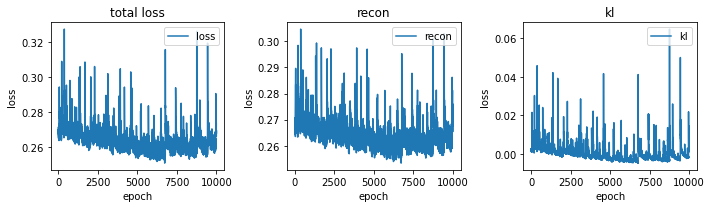

In [29]:
model_history(vae_one_channel,'kl')

In [30]:
from ipywidgets import interactive
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def viewer(index):
    check_VAE_output(mod_x_train,index,BASE_PATCH_WIDTH,encoder,decoder)


interactive_image = interactive(viewer, index = (0,x_train.shape[0]-1))
output = interactive_image.children[-1]
# output.layout.height = '300px'
interactive_image

interactive(children=(IntSlider(value=342, description='index', max=685), Output()), _dom_classes=('widget-int…

PCA explained_variance_ratio : [0.64405656 0.05036595 0.04505514]
PCA singular_values : [233.93484   65.418625  61.873558]


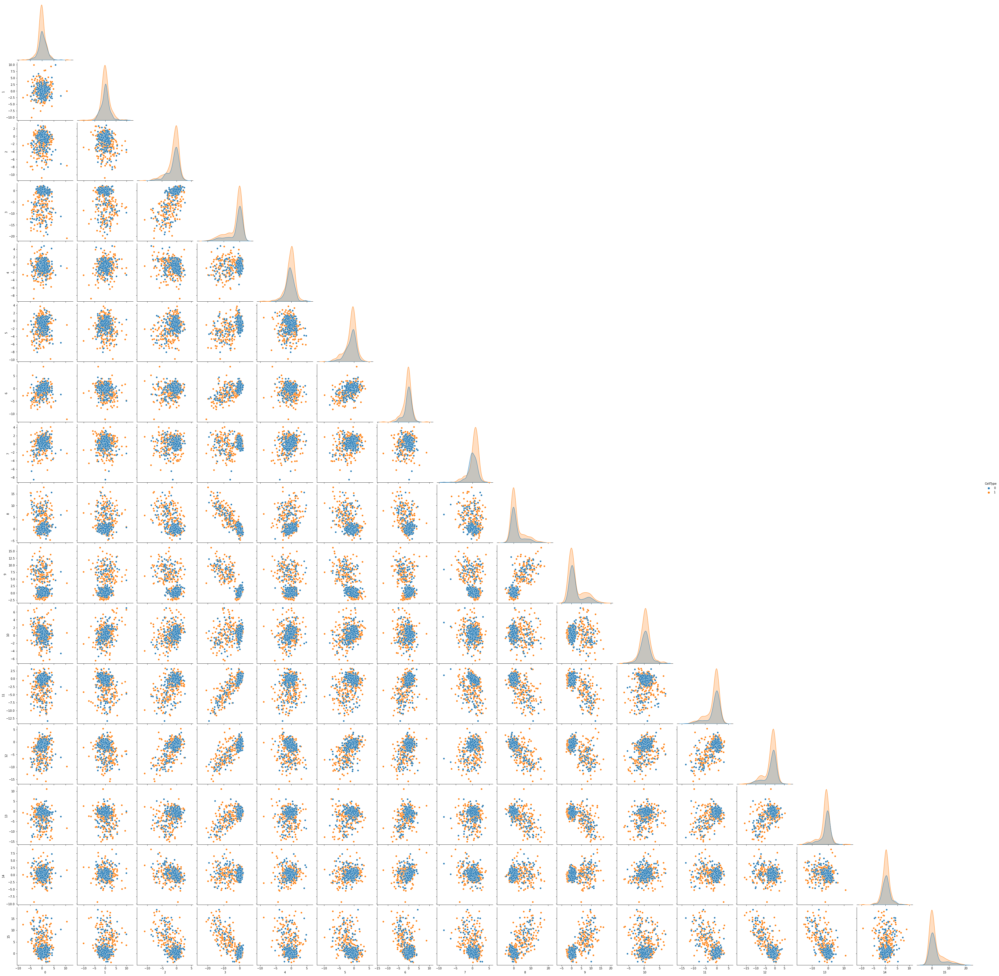

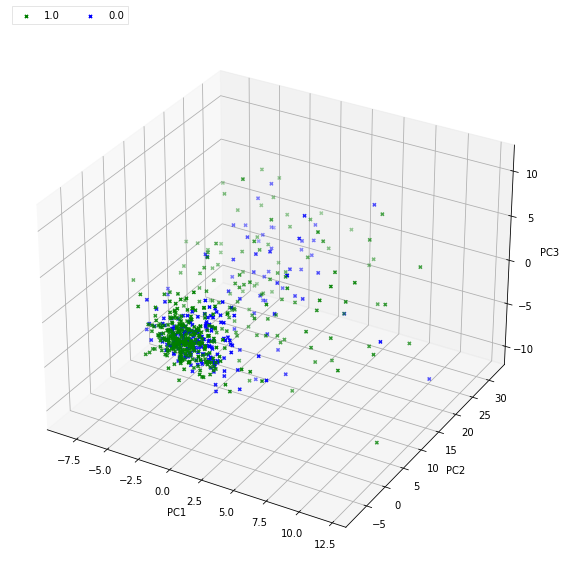

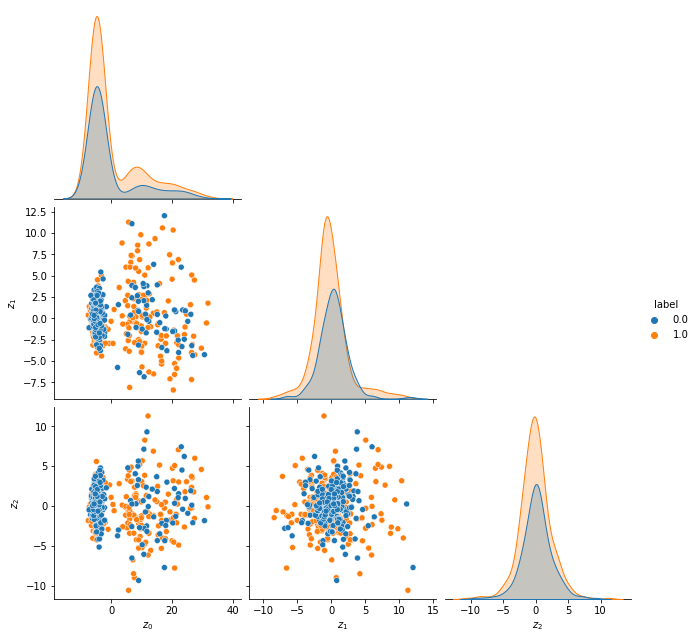

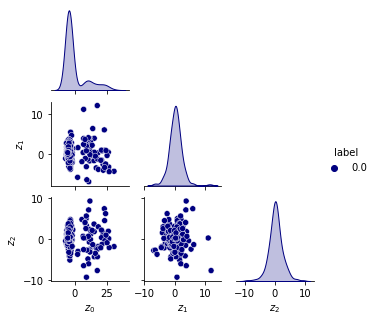

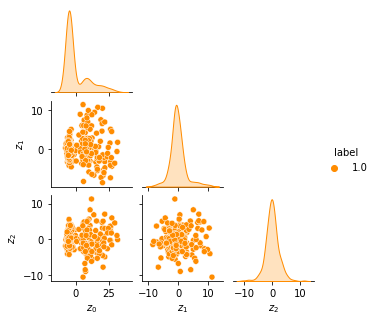

In [31]:
view_latent_variable_clusters(mod_x_train,y_train,cell_types,encoder,pairplot_height=3,PCA_flag='yes',
    PCA_figwidth=8)  

In [36]:
z = encoder.predict(mod_x_train)[2]

print('latent dimension shape', z.shape)

latent dimension shape (686, 16)


In [44]:
import pandas as pd
import numpy as np
from numpy import matlib
import time
from scipy.stats import norm
import random
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
from matplotlib import rc

In [37]:
def _format_soft_km_axes(ax, **kwargs):
    
    """
    Customized 
    input: axes and key word arguments
    param: ax - axes to be formatted
    param: border - boolean, True = grey border, False = None. Default True
    """
    
    rc('font', family = 'serif')
    
    # Set border
    border = True
    if 'border' in kwargs:
        border = kwargs['border']
        
    if border:
        ax.spines['top'].set_color('grey')
        ax.spines['right'].set_color('grey')
        ax.spines['bottom'].set_color('grey')
        ax.spines['left'].set_color('grey')
    else:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        
    # Format label and tick fonts
    tickwidth = 1
    if border == False:
        tickwidth = 2
    
    ax.xaxis.label.set_size(16)
    ax.xaxis.label.set_color('grey')
    ax.yaxis.label.set_size(16)
    ax.yaxis.label.set_color('grey')
    ax.title.set_color('grey')
    ax.tick_params(axis='both', which='major', labelsize=16, labelcolor = 'grey')
    
    return ax


In [52]:
def soft_clustering_weights(data, cluster_centres, **kwargs):
    
    """
    Function to calculate the weights from soft k-means
    data: Array of data. Features arranged across the columns with each row being a different data point
    cluster_centres: array of cluster centres. Input kmeans.cluster_centres_ directly.
    param: m - keyword argument, fuzziness of the clustering. Default 2
    """
    
    # Fuzziness parameter m>=1. Where m=1 => hard segmentation
    m = 2
    if 'm' in kwargs:
        m = kwargs['m']
    
    Nclusters = cluster_centres.shape[0]
    Ndp = data.shape[0]
    Nfeatures = data.shape[1]

    # Get distances from the cluster centres for each data point and each cluster
    EuclidDist = np.zeros((Ndp, Nclusters))
    for i in range(Nclusters):
        EuclidDist[:,i] = np.sum((data-np.matlib.repmat(cluster_centres[i], Ndp, 1))**2,axis=1)
    

    
    # Denominator of the weight from wikipedia:
    invWeight = EuclidDist**(2/(m-1))*np.matlib.repmat(np.sum((1./EuclidDist)**(2/(m-1)),axis=1).reshape(-1,1),1,Nclusters)
    Weight = 1./invWeight
    
    return Weight



In [39]:
y_train.shape

(686,)

In [40]:
y = y_train

In [41]:
#load data for fuzzy C-means
X = z
# y = iris['target']

df = pd.DataFrame(
    columns = ['LatDim 0', 'LatDim 1', 'LatDim 2', 'LatDim 3',
              'LatDim 4', 'LatDim 5', 'LatDim 6', 'LatDim 7',
              'LatDim 8', 'LatDim 9', 'LatDim 10', 'LatDim 11',
              'LatDim 12', 'LatDim 13', 'LatDim 14', 'LatDim 15'],
    data = X
)
df['Labels'] = y

In [45]:
#regular sklearn kmeans

kmeans = KMeans(n_clusters = 2, random_state = 42).fit(X)

df['Class'] = kmeans.labels_

In [56]:
for i in range(3):
    df['p' + str(i)] = 0
    
df[['p0', 'p1']] = soft_clustering_weights(X, kmeans.cluster_centers_)

In [57]:
df['confidence'] = np.max(df[['p0', 'p1']].values, axis = 1)

In [47]:
# Make sure colours are the same for the actual class and the kmeans class in the plots.
# Count the most frequent species that appears in each class
df_color_converter = df.groupby('Class', as_index = False)['Labels'].mean().round().astype(int)
color_converter_dict = {}
for ind in df_color_converter.index:
    color_converter_dict[ind] = df_color_converter.loc[ind, 'Labels']

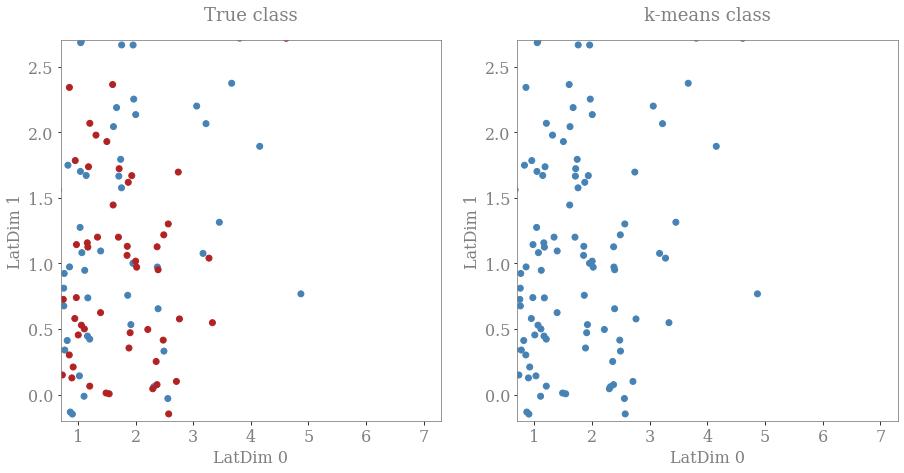

In [64]:
colors = ['firebrick', 'steelblue']
# colors = ['firebrick', 'steelblue', 'forestgreen']

fig, axs = plt.subplots(1, 2, figsize = (15,7))

ax = _format_soft_km_axes(axs[0])

ax.scatter(
    X[:,0],
    X[:,1],
    color = [colors[i] for i in y]
)

ax.set_xlabel('LatDim 0')
ax.set_ylabel('LatDim 1')
ax.set_title('True class', pad = 20, fontsize = 18)

ax.set_ylim(-0.2, 2.7)
ax.set_xlim(0.7, 7.3)


ax = _format_soft_km_axes(axs[1])
ax.scatter(
    X[:,0],
    X[:,1],
    color = [colors[color_converter_dict[i]] for i in kmeans.labels_]
)


ax.plot(
    kmeans.cluster_centers_[:,-2],
    kmeans.cluster_centers_[:,-1],
    'xk',
    markersize = 15,
    markeredgewidth = 3
)

ax.set_xlabel('LatDim 0')
ax.set_ylabel('LatDim 1')
ax.set_title('k-means class', pad = 20, fontsize = 18)


ax.set_ylim(-0.2, 2.7)
ax.set_xlim(0.7, 7.3)

# fig.savefig('Figures/kmeans.png', dpi = 500, bbox_inches = 'tight')

plt.show()

Text(0.5, 1.0, 'Confident kmeans class')

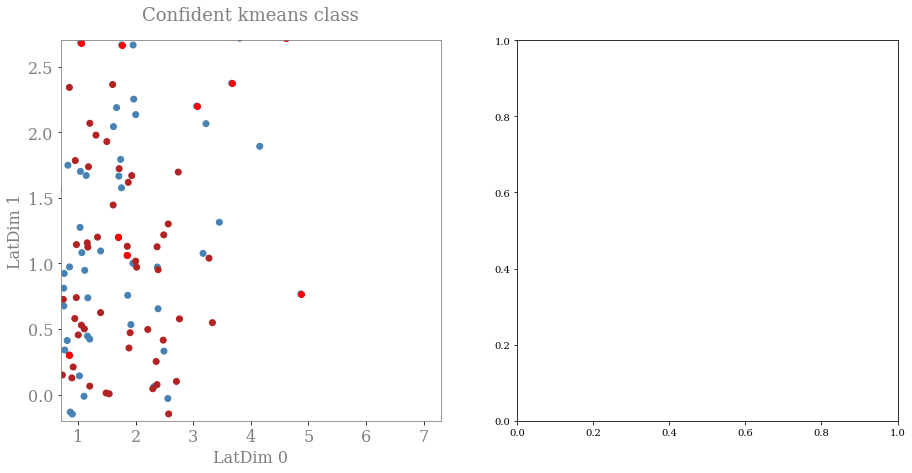

In [63]:
colors = ['firebrick', 'steelblue']

fig, axs = plt.subplots(1, 2, figsize = (15,7))

ax = _format_soft_km_axes(axs[0])

ax.scatter(
    X[:,0],
    X[:,1],
    color = [colors[i] for i in y]
)

ax.set_xlabel('LatDim 0')
ax.set_ylabel('LatDim 1')
ax.set_title('All points', pad = 20, fontsize = 18)

ax.set_ylim(-0.2, 2.7)
ax.set_xlim(0.7, 7.3)


ax = _format_soft_km_axes(axs[0])

confidence_threshold=0.9 #0.9 default

ax.scatter(
    df.loc[df['confidence'] < confidence_threshold, 'LatDim 0'],
    df.loc[df['confidence'] < confidence_threshold, 'LatDim 1'],
#     color = df.loc[df['confidence'] > confidence_threshold, 'Class'].apply(lambda x: colors[color_converter_dict[x]])
    color = ['red']
)

ax.plot(
    kmeans.cluster_centers_[:,-2],
    kmeans.cluster_centers_[:,-1],
    'xk',
    markersize = 15,
    markeredgewidth = 3
)

ax.set_xlabel('LatDim 0')
ax.set_ylabel('LatDim 1')
ax.set_title('Confident kmeans class', pad = 20, fontsize = 18)

